# Overview of notebook

1. [Motivation](#Motivation)
2. [Basic_stats](#Basic_stats)
    - 2.1 [Cleaning and pre-processing the data](#2-1)
    - 2.2 [Simple dataset stats](#2-2)
3. [Tools, theory and analysis](#Tools_theory_and_analysis)
    - 3.1 [Sentiment analysis](#3-1)
    - 3.2 [Community detection](#3-2)
    - 3.3 [TF-IDF](#3-3)
    - 3.4 [Word-clouds for TF-IDF visualizations](#3-4)
    - 3.5 [Topic extraction with NMF](#3-5)
    - 3.6 [Interactive KDE plot with plotly](#3-6)
    - 3.7 [Interactive network visualization with Gephi](#3-7)
4. [Discussion](#Discussion)
5. [Contributions](#Contributions)

**Appendix**

6. [Scraping notebook](https://nbviewer.jupyter.org/github/goh12/The-Music-Industry/blob/master/notebooks/Scrapers%20explainer.ipynb)

<a id='Motivation'></a>

# 1. Motivation

**The dataset(s):** We chose to create our own datasets for this project using two main sources. The exact details and code used in the creation of the datasets can be found in the appendix as seen in the overview
    
1. **Spotify:** We chose to use the Spotify API to create our own network dataset. We used the 'related artists' API to generate a network by starting at Kanye West and then slowly growing the network outward using the new artists found at each step. We prioritized the search from nodes with high popularity to increase the odds of them having lyrics. After having grown the network to ~100.000 nodes, we decided to narrow the scope and maintain at least some possibility of visualizing our network or performing any analysis by selecting a subset of artists. We used both the top 3000 artists by 'popularity' and by 'followers', so we'd get a mix of currently famous and historically famous artists. 
    
2. **Genius:** We used the genius API to create a list of up to 10 songs for each artist, depending on how many they had on the website. We then scraped additional information for each song. We had to use a third-party package called lyricsgenius to scrape the lyrics directly off the website since they don't offer a direct API to fetch lyrics for the songs.  

**The motivation:** We were really interested in these datasets since we are of course very familiar with the topic domain and were interested in seeing this information in a new light. We also thought it might be interesting to use the text-analysis tools we'd learned in the course on lyrics.  

**The goal:** The goal was of course to find something interesting in the data but we were very excited at the possibility of using what we produced in the experiment as a tool to discover new musicians similar to those we already knew and loved. So we wanted some form of discovery to be a part of our results, which we did implement with the interactive Gephi plots. We also wanted to discover some narrative to give the end-user some new insight or a confirmation of an intuition they might have had but never known for sure if it was true.  


# Imports

In [2]:
import json
import collections
import requests
import urllib
import time
import os.path
import concurrent.futures
import nltk
import cv2
import community
import warnings
import datetime

import pandas as pd
import numpy as np
import networkx as nx
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import plotly.figure_factory as ff
from matplotlib.lines import Line2D
from matplotlib.pyplot import cm
from importlib import reload

from collections import Counter
from fa2 import ForceAtlas2
from PIL import Image
from sklearn.decomposition import NMF
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from langdetect import detect
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import words
from nltk.sentiment.vader import SentimentIntensityAnalyzer

warnings.simplefilter(action='ignore', category=FutureWarning)

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('words')
nltk.download('vader_lexicon')

[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package words to /home/jovyan/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

# Variables

In [3]:
# file directories
url_artist = './Data/Related artist network data/artists.csv'
url_edges = './Data/Related artist network data/edges.csv'
url_genres = './Data/Related artist network data/genres.txt'
url_lyrics = './Data/Lyrics data/lyrics.csv'

url_processed_lyrics = './Data/Lyrics data/tokenized_and_filtered_lyrics.csv'
url_tokenized_lyrics = './Data/Lyrics data/tokenized_lyrics.csv'
url_song_relase_date= './Data/Lyrics data/song_release_date.csv'
url_TF_IDF_lyrics = './Data/Lyrics data/TF_IDF.csv'

url_genres_by_artist_count = './Data/genres_by_artist_count.csv'
url_wordcloud_folder = './Data/Wordclouds/TF-IDF/'
# Mask images
url_image_happy = './Data/img/happy.png'
url_image_sad = './Data/img/sad.png'

# Fonts for wordclouds
url_rock_font = './Data/fonts/FingerPaint-Regular.ttf'
url_pop_font = './Data/fonts/Monoton-Regular.ttf'
url_indie_rock_font = './Data/fonts/Lobster-Regular.ttf'
url_electro_house_font = './Data/fonts/BungeeShade-Regular.ttf'
url_hip_hop_font = './Data/fonts/RockSalt-Regular.ttf'
url_rap_font = './Data/fonts/SigmarOne-Regular.ttf'
url_funk_font = './Data/fonts/Ranchers-Regular.ttf'
url_modern_rock_font = './Data/fonts/TradeWinds-Regular.ttf'
url_country_rock_font = url_rock_font

# External urls
url_labmt = 'https://journals.plos.org/plosone/article/file?type=supplementary&id=info:doi/10.1371/journal.pone.0026752.s001'


lemmatizer = WordNetLemmatizer()
tokenizer = nltk.RegexpTokenizer(r"\w+")
stop_words = set(stopwords.words('english'))

### General helper functions

- <code>load_current_artist_dataframe</code>: Loads the artist dataframe. List of ~100k artists scraped from spotify using the ‘related artists’ Spotify API.
- <code>load_current_edge_dataframe</code>: Loads the network edge dataframe. List of network edges created using the ‘related artists’ Spotify API. The ‘from’ variable is the artist whose page points to the ‘to’ artists page.
- <code>load_current_genre_dict</code>: Loads the genre json object. Uses artist IDs as keys and a list of genres associated with that artist. Gathered using the spotify ‘related artists’ API.
- <code>load_tokenized_dataframe</code>: Loads the table with all the songs we got from the ‘search’ and ‘song’ APIs from Genius. The lyrics were scraped with the ‘lyricsgenius’ python package. 
- <code>load_all</code>: Loads the artist, edge and genre data
- <code>restore_list_from_string</code>: Fixes a list saved from a pandas.csv file back to a list after it's been stringified.  

In [3]:
def load_current_artist_dataframe():
    return pd.read_csv(url_artist,index_col=0)

def load_current_edge_dataframe():
    return pd.read_csv(url_edges,index_col=0)

def load_current_genre_dict():
    string = open(url_genres).read()
    json_object = json.loads(string)
    return json_object 

def load_tokenized_dataframe():
    df = pd.read_csv(url_tokenized_lyrics, index_col=0)
    df.loc[:,'tokenized'] = df.loc[:,'tokenized'].apply(restore_list_from_string)
    return df

def load_all():
    genre_dict = load_current_genre_dict()
    edges = load_current_edge_dataframe()
    artists = load_current_artist_dataframe()
    return artists,genre_dict,edges

def restore_list_from_string(string):
    substrings = string[1:-1].split(',')
    return [substrings[0][1:-1]] + [x[2:-1] for x in substrings[1:]]

# Importing datasets

In [4]:
artists,genre_dict,edges = load_all()
df_song_lyrics = pd.merge(load_tokenized_dataframe(),pd.read_csv(url_song_relase_date,index_col=0).loc[:,['api_path','release_date']],'outer',on='api_path')

<a id='Basic_stats'></a>

# 2. Basic stats

Before we talk about our choices for preprocessing the data, let's see some basic information about the data we gathered. This includes:
- All in the untrimmed network gathered through the 'Related artist crawler'
- A dictionary with the list of genres for each of those artists 
- All the edges gathered from this process. These edges are directed and point from an artist to all the artists in his 'related artists' list. 

In [5]:
print(f'There are {len(artists)} artists in the untrimmed network, {len(edges)} directed edges and'+ \
                f' {len(np.unique(np.concatenate(list(genre_dict.values()))))} unique genres in the data')

There are 105411 artists in the untrimmed network, 832576 directed edges and 4585 unique genres in the data


<a id='2-1'></a>

## 2.1 Cleaning and pre-processing the data

Because we are interested in visualizing the network as well as performing an analysis on the TF-IDF data later in this notebook,
we must perform a lot of filtering on the data. The best way to go about such filtering is to first have way too much data and a rough
idea of what you're interested in analyzing, then you can start trimming away the data you're least interested in and be left with much
higher quality data on average.

With a bit of trial and error, we found that ~4000 artists was a good number for visualization but not too small that we couldn't
see some interesting structure in the network. We selected these 4000 artists by selecting all artists that were either in the top
3000 by popularity or the top 3000 by followers. Since there was a lot of overlap between the two, the total was close to ~4000. 
Of those not all had lyrics on the Genius website, so the total number of artists with lyrics we closer to ~3400.

From this subset, we gathered up to 10 song lyrics for each artist. Let's look at this data now 


In [6]:
print(f'There are {len(df_song_lyrics)} songs in total by {len(np.unique(df_song_lyrics.primary_artist))} unique artist')

There are 27435 songs in total by 3406 unique artist


There are two ways we can transform the lyrics data into useable data: 
- By tokenizing the songs for sentiment analysis 
- By vectorizing the tokenized songs using TF-IDF for generating word clouds and performing topic extraction with NMF. 

For the sentiment analysis and word clouds, we are exclusively interested in English lyrics, since we'd have a hard time interpreting results in other languages. 
Also, if we include results from other languages, we'd end up with way too many unique words and our TF-IDF matrix would be too big for computational purposes.
We set our sights on reducing the number of songs from about ~27k to 10-12k. We also want to limit the number of unique words in total. 

For this reason, we have some objective for which to select a subset of the songs, based on how good they will be in these transformed states. 
First, we needed to tokenize the strings, remove stop words, and lemmatize the words. Removing the stop words and lemmatizing 
takes away unimportant words and also combines words similar in meaning, further reducing the number of unique words

Then we compute some variables to use as filtering criteria:
- Number of unique words in the songs (we're less interested in songs that just repeat the same 1-3 words over and over)
- Number of total words in a song 
    - Some of the longest songs are concerts or rap-battles which is more like many songs rather than one. 
    - Not too short, many instances of 'instrumental' or other descriptions which are not lyrics
- Text language (We want to filter out all non-English lyrics, for that we use a language detection package.)

### Helper functions for preprocessing

- <code>tokenize</code>: Takes in a string and returns a list of tokenized strings
- <code>only_ascii_chars</code>: Takes in a string and returns true if only ASCII characters are in the string
- <code>remove_stop_words_and_lemmatize</code>: Takes in a tokenized string list and returns it after removing stop words and words with non-ASCII characters and then lemmatizes the words. 
- <code>detect_or_none</code>: Returns a language if one was detected, None otherwise
- <code>page_views_or_none</code>: Returns a page view number if one exists, None otherwise


In [7]:
def tokenize(string):
    text_tokenized = tokenizer.tokenize(string)
    return text_tokenized
    
def only_ascii_chars(unistr):
    return unistr.isascii()

def remove_stop_words_and_lemmatize(text_tokenized):
    # set to lower case / remove stopwords / only alphabetical words
    text_tokenized_filtered = [w.lower() for w in text_tokenized if (w.lower() not in stop_words) and (only_ascii_chars(w))] 

    word_list = [lemmatizer.lemmatize(word) for word in text_tokenized_filtered]

    return word_list

def detect_or_none(string):
    try:
        return detect(string)
    except:
        return None

def page_views_or_none(string):
    try:
        return json.loads(string.replace('\'','\"').replace("False","\"False\""))['pageviews']
    except:
        return None

In [8]:
df_song_lyrics.loc[:,'language'] = df_song_lyrics.lyrics.apply(detect_or_none)

# Only tokenizes the lyrics if it hasn't been done before. 
if 'tokenized' not in df_song_lyrics.columns:
    df_song_lyrics.loc[:,'tokenized'] = df_song_lyrics.lyrics.apply(tokenize_and_remove_stop_words)
    df_song_lyrics.loc[:,'tokenized'] = df_song_lyrics.tokenized.apply(remove_stop_words_and_lemmatize)

# Only uncomment if you wish to overwrite the data 
# df.to_csv(url_tokenized_lyrics)

In [9]:
df_song_lyrics.loc[:,'unique_words_in_song'] = df_song_lyrics.loc[:,'tokenized'].apply(lambda x:len(np.unique(x)))
df_song_lyrics.loc[:,'token_count'] = df_song_lyrics.loc[:,'tokenized'].apply(lambda x:len(x))
df_song_lyrics.loc[:,'pageviews'] = df_song_lyrics.loc[:,'stats'].apply(lambda x:page_views_or_none(x))

In [10]:
df_subset = df_song_lyrics.loc[(df_song_lyrics.language == 'en') &
                               (df_song_lyrics.lyrics != 'Instrumental') &
                               (df_song_lyrics.lyrics != '{Instrumental track}') & 
                               (df_song_lyrics.loc[:,'token_count']<1000) &
                               (df_song_lyrics.loc[:,'token_count']>50) &
                               (~df_song_lyrics.loc[:,'release_date'].isna()) &
                               (~df_song_lyrics.loc[:,'pageviews'].isna() & (df_song_lyrics.loc[:,'pageviews']>20000))].copy()

Let's look at some of the characteristics of our new subset of lyrics

In [11]:
print(f'There are {len(df_subset)} songs in total by {len(np.unique(df_subset.primary_artist))} unique artist')

There are 10216 songs in total by 1884 unique artist


In [12]:
print(f'There are currently {len(np.unique(np.concatenate(df_subset.tokenized.values)))} unique words')

There are currently 41400 unique words


In [13]:
word_counts = pd.Series(np.concatenate(df_subset.tokenized.values)).value_counts()
allowable_words = set(word_counts.loc[word_counts>=10].index.values)
df_subset.loc[:,'tokenized_filtered'] = df_subset.loc[:,'tokenized'].apply(lambda x:[y for y in x if y in allowable_words])

In [14]:
df_subset.columns

Index(['annotation_count', 'api_path', 'full_title',
       'header_image_thumbnail_url', 'header_image_url', 'id',
       'lyrics_owner_id', 'lyrics_state', 'path', 'pyongs_count',
       'song_art_image_thumbnail_url', 'song_art_image_url', 'stats', 'title',
       'title_with_featured', 'url', 'primary_artist', 'lyrics', 'language',
       'tokenized', 'release_date', 'unique_words_in_song', 'token_count',
       'pageviews', 'tokenized_filtered'],
      dtype='object')

In [15]:
name_to_id_dict = {name:artists.loc[artists.name == name].index[0] for name in df_subset.primary_artist.unique()}
df_subset.loc[:,'artist_id'] = df_subset.primary_artist.apply(lambda x:name_to_id_dict[x])
df_tokenized = df_subset.loc[:,["artist_id", "primary_artist", "title",'release_date',"lyrics","tokenized_filtered"]].copy()
df_tokenized = df_tokenized.rename(columns={"title":"song_name","primary_artist":"artist_name", "lyrics":"song_lyrics"})


In [16]:
print(f'There are currently {len(np.unique(np.concatenate(df_tokenized.tokenized_filtered.values)))} unique words')

There are currently 9873 unique words


<a id='2-2'></a>
## 2.2 Simple dataset stats

### Network properties

Let's analyze the complete 100k node network and its properties to get a feeling for the data we're working with.  
We'll create a random network with the same number of nodes and edges and compare the degree distributions and also look at some interesting outliers and nodes with specific properties to check if our intuition about what we should see is correct.

In [17]:
G = nx.DiGraph()
node_data_list = [(index,{'name':name_,
                              'searched':searched_,
                              'popularity':popularity_,
                              'followers':followers_}) for \
                  index,name_,searched_,popularity_,followers_ in \
                  zip(artists.index.values,
                      artists.name.values,
                      artists.searched.values,
                      artists.popularity.values,
                      artists.followers.values)]
G.add_nodes_from(node_data_list)
G.add_edges_from([tuple(x) for x in edges.loc[:,['from','to']].values])

degree_list = list(dict(G.degree()).values())
degree_count = pd.Series(degree_list).value_counts()


In [18]:
N_edges = len(G.edges())
N_nodes = len(G.nodes())
p = N_edges/(N_nodes*(N_nodes-1))
random_network = nx.fast_gnp_random_graph(N_nodes,p,directed=True)

In [19]:
degree_list_in = list(dict(G.in_degree()).values())
degree_list_out = list(dict(G.out_degree()).values())
degree_list_total = list(dict(random_network.degree()).values())

degree_count_in = pd.Series(degree_list_in).value_counts()
degree_count_out = pd.Series(degree_list_out).value_counts()
degree_count_total = pd.Series(degree_list_total).value_counts()

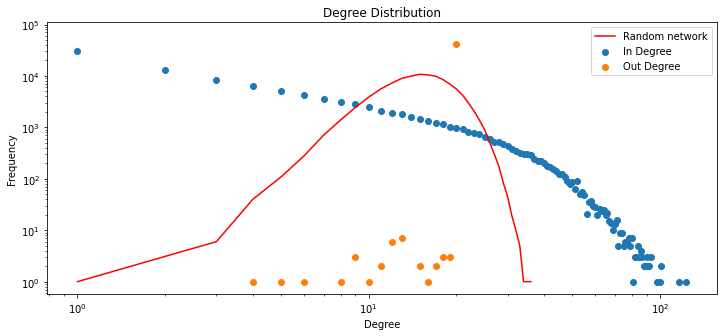

In [20]:
plt.figure(figsize=(12,5))
plt.title('Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Frequency')
ind = plt.scatter(degree_count_in.index, degree_count_in)
outd = plt.scatter(degree_count_out.index, degree_count_out)
rand_argsort = np.argsort(degree_count_total.index)
totd = plt.plot(degree_count_total.index[rand_argsort], degree_count_total.iloc[rand_argsort],color='red')
plt.legend(['Random network','In Degree', 'Out Degree',])
plt.xscale('log')
plt.yscale('log')
plt.show()

**Comment:** What we see is that the in-degree distribution looks a lot like a scale-free network when seen on a log-log plot. It's at least very unlike a random network but since we see a slight curve to the in-degree it doesn't perfectly follow a power-law distribution either. An interesting thing here is the out-degree, which looks very artificial because of the nature of how the network was generated. Because the 'related artists' API only returns at most 20 artists, we see the most common out-degree being 20 but no smooth distribution before or after that, only very few instances of less than 20 artists and at least 1 artist. Because this network is artificial in nature we expect to see some artifacts because of that. This is also a slight motivation to use an undirected version of the network later on for analysis since we'd expect to see more reasonable and normal network properties like that.

We want to see if there is a relationship between the number of followers an artist has and the degree. This would make sense if we consider how preferential attachment works. That is because the 'related artists' API gives us a list of artists that 'people also listen to', we would think popular artists should appear a lot in these lists and so have a large in_degree. Let's visualize this with a followers/degree scatter plot

In [21]:
in_degree_df = pd.DataFrame(G.in_degree()).sort_values(1)
in_degree_df.loc[:,'name'] = [artists.at[ID,'name'] for ID in in_degree_df.loc[:,0]]
in_degree_df.loc[:,'followers'] =  [artists.at[ID,'followers'] for ID in in_degree_df.loc[:,0]]
in_degree_df.loc[:,'popularity'] =  [artists.at[ID,'popularity'] for ID in in_degree_df.loc[:,0]]
in_degree_df = in_degree_df.rename({1:'in degree',0:'artist id'},axis='columns')
in_degree_df.head(2)

,artist id,in degree,name,followers,popularity
105410,2Nj5eY05IUPK0AZKBzR9xB,1,Marina De Oliveira,46865.0,28.0
75057,4WkB8nPecA79z517dt342q,1,TOSHI,42.0,29.0


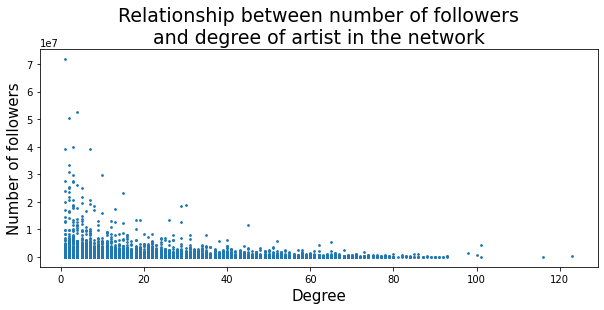

In [24]:
plt.figure(figsize=(10,4))
plt.scatter(in_degree_df.loc[:,'in degree'],in_degree_df.loc[:,'followers'],s=3)
plt.xlabel('Degree',fontsize=15)
plt.ylabel('Number of followers',fontsize=15)
plt.title('Relationship between number of followers\nand degree of artist in the network',fontsize=19)
plt.show()

**Comment:** We see an inverse relationship between the number of followers and the degree of an artist. This result is at first counterintuitive for the reasons mentioned above, but upon further thinking, it might be quite logical that this is by design. It's not unlikely that artists such as ed-Sheeran are listened to by all sorts of people regardless of what other musicians they listen to. Such a list of artists wouldn't be of interest or use to someone. Likely, Spotify has instead designed this list such that it shows **artists that people also listen to (More than the average person)**. Such a list would be useful since it would show a person artists they are likely to be interested in which are not just generically liked by everyone.  

Let's take a look at some of these most extreme values and see if they make sense

In [25]:
most_followed = in_degree_df.loc[in_degree_df.followers.idxmax(),:]
print(f'the most followed artist is: {most_followed["name"]} with' + \
      f' {int(most_followed["followers"])} followers and an in degree = {most_followed["in degree"]}')

the most followed artist is: Ed Sheeran with 71741230 followers and an in degree = 1


**Comment:** This confirms our prior belief that Spotify is very unlikely to 'recommend' or point to the biggest artists, probably because they are already listened to by so many.  Let's also look at the most connected artist

In [26]:
most_connects = in_degree_df.loc[in_degree_df.loc[:,'in degree'].idxmax(),:]
print(f'the artist with the highest in-degree is: {most_connects["name"]} with' + \
      f' {int(most_connects["followers"])} followers and an in degree = {most_connects["in degree"]}')

the artist with the highest in-degree is: Carlie Hanson with 214336 followers and an in degree = 123


**Comment:** This was surprising as no one in the group knew who this artist was, but it was somehow still the most connected artists. We think this is because this particular artist might be very highly listened to within its own little community and so Spotify might be likely to point to her since her overall listens are low but her 'within community popularity' is maybe quite high. 

In [27]:
most_popular = in_degree_df.loc[in_degree_df.loc[:,'popularity'].idxmax(),:]
print(f'the most popular artist is: {most_popular["name"]} with' + \
      f' {int(most_popular["followers"])} followers and an in degree = {most_popular["in degree"]}')

the most popular artist is: Drake with 50573380 followers and an in degree = 2


**Comment:** This again is similar with what we saw with Ed Sheeran and is another indication that our theory is correct

<a id='Tools_theory_and_analysis'></a>

# 3. Tools, theory, and analysis

Each subsection in this chapter shows an analysis that was conducted using the following step-by-step approach
- Explain what you're interested in
- Explain the tool
- Apply the tool
- Discuss the outcome

<a id='3-1'></a>
# 3.1 Sentiment analysis
### What we're interested in

We're interested in seeing how emotions are shown in song lyrics and trying to detect which songs and artists convey more positive or negative emotions. Furthermore, we want to explore the genres and detect whether some genres tend to be darker/sadder than others, e.g., is there an apparent difference in happiness between rap and country? How much of the lyrical content within the songs of the saddest/happiest genres is really considered negative or positive?

In addition, the music industry is constantly changing and evolving, and therefore, it is interesting to see the changes in music sentiments over the years.

Two separate features are used to explore the sentiment of the lyrical content, *LabMT wordlist* and the sentiment analysis tool *VADER*.

### Sentiment analysis - How it works
***LabMT wordlist***

The [LabMT](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752) wordlist is used to classify the tokenized words from ~12,000 English lyrics by ~2,000 artists. The list includes common words and their average happiness score that can be applied to songs, artists, and genres.

Each song lyric is tokenized and the average happiness score is calculated from the words found in the LabMT wordlist.

***VADER***

[VADER](https://www.geeksforgeeks.org/python-sentiment-analysis-using-vader/) is used to further analyze the lyrical content of the happiest and saddest genres. We would like to know the proportion of negative and positive terms within each song of the extreme genres to familiarize the characteristics that make a genre happy or sad.

VADER is an NLTK sentiment analysis tool, VADER. The model is a lexicon and rule-based sentiment analysis tool which is sensitive to polarity, i.e., positive/negative, and the intensity of emotion. Within each song lyric, the proportion of positive, negative, and neutral words is found, i.e., the sum of the positive, negative, and neutral scores is equal to 1 for each song.

Words like ‘love’ and ‘happy’ represent a positive sentiment. It can also understand the basic contexts, e.g., it categorizes “not happy” as a negative statement.

### Helper functions
- <code>load_genre</code>: Loads the data on genres every artist belongs to
- <code>calc_sentiment</code>: Creates a dataframe with the tokenized & filtered lyrics and merges it with the LABMT dataframe. Finally, selects the happiness average of the merged average and calculates the mean.
- <code>calc_song_avg_happiness</code>: Calculates the average happiness score for every song and adds it as a column to the dataframe.
- <code>calc_artist_avg_happiness</code>: Collects the artists with 3 songs or more in the dataset. Calculates the average happiness score for every artist and adds it as a column to the dataframe. Further, creates a unique dataframe for the artist sentiment.
- <code>calc_genre_avg_happiness</code>: Calculates the average happiness score for the most frequent genres and adds it as a column to the dataframe. Further, creates a unique dataframe for the genre sentiment.
- <code>most_freq_genre</code>: Finds the most frequent genre of the genres the artist belongs to.
- <code>sentiment_vader_lyrics</code>: Use NLTK's VADER sentiment analysis tool to categorize words within each song as positive, negative, or neutral and calculate the proportion of positive, negative, and neutral words in each lyric. The function iterates over all the rows within the dataframe and stores the rating outcome of each song lyric in lists. Finally, it adds the ratings as columns in the dataframe.


In [28]:
def calc_sentiment(tokens):
    happiness_avg_page = pd.DataFrame(tokens, columns=['word']).merge(labmt_df, on = 'word').happiness_average.mean()
    return happiness_avg_page

def calc_song_avg_happiness(df):
    content_happiness_averages = list()
    for index, row in df.iterrows():
        content_happiness_averages.append(calc_sentiment(list(row['tokenized'])))
    
    df['happiness_average'] = content_happiness_averages
    return df

def calc_artist_avg_happiness(df):

    df['artist_happiness_average'] = df.groupby(['artist_name']).happiness_average.transform('mean')

    remove_artist = df.groupby("artist_name").filter(lambda x: len(x) < 3)['artist_name'].value_counts()

    artist_df = df[['artist_name', 'artist_id', 'artist_happiness_average']].copy()
    artist_df = artist_df[~artist_df['artist_name'].isin(remove_artist.index)]
    artist_df = artist_df.drop_duplicates(subset=None, keep='first', inplace=False)
    return df, artist_df

def calc_genre_avg_happiness(df):
    df['genre_happiness_average'] = df.groupby(['most_freq_genre']).artist_happiness_average.transform('mean')

    genres_df = df[['most_freq_genre', 'genre_happiness_average' ]].copy()
    genres_df = genres_df.drop_duplicates()
    return df, genres_df

def most_freq_genre(genres_freq_df, genres_lyrics_df):
    genre_value = { row["genre_type"]: row["frequency"] for index, row in genres_freq_df.iterrows()}

    most_freq_genre = []

    for index, row in genres_lyrics_df.iterrows():
        curr_genres = { genre : genre_value[genre] for genre in row['genres']}
        if curr_genres:
            most_freq_genre.append(max(curr_genres, key=curr_genres.get))
        else:
            most_freq_genre.append("")

    genres_lyrics_df["most_freq_genre"] = most_freq_genre
    return genres_lyrics_df

def sentiment_vader_lyrics(df):
    negative_words = []
    neutral_words = []
    positive_words = []
    normalized = []

    for lyric in df.index:
        rating = sentiment_analyzer.polarity_scores(df['song_lyrics'].iloc[lyric])
        positive_words.append(rating['pos']) 
        negative_words.append(rating['neg'])
        neutral_words.append(rating['neu'])

    df['positive'] = positive_words
    df['negative'] = negative_words
    df['neutral'] = neutral_words

    return df

### Prepare and import data
1. Copy of the lyrics subset
2. Create dataframe of genres by count
3. Compute sentiment

In [29]:
lyrics_df = df_subset.copy()
lyrics_df.loc[:,'artist_name'] = lyrics_df.loc[:,'primary_artist']
lyrics_df.loc[:,'song_name'] = lyrics_df.loc[:,'title']
lyrics_df.loc[:,'song_lyrics'] = lyrics_df.loc[:,'lyrics']
labmt_df = pd.read_csv(url_labmt, sep="\t", skiprows=2)
genres_count_df = pd.read_csv(url_genres_by_artist_count)

genres_count_df.columns = ["genre_type", "frequency"]
genres_df = pd.DataFrame(genre_dict.items(), columns=['artist_id', 'genres'])
genres_combined_df = most_freq_genre(genres_count_df, genres_df)

sentiment_df = pd.merge(lyrics_df, genres_combined_df, on="artist_id")
sentiment_df['year'] = pd.DatetimeIndex(sentiment_df['release_date']).year
sentiment_df = calc_song_avg_happiness(sentiment_df)

sentiment_analyzer = SentimentIntensityAnalyzer()

### Song sentiment distribution

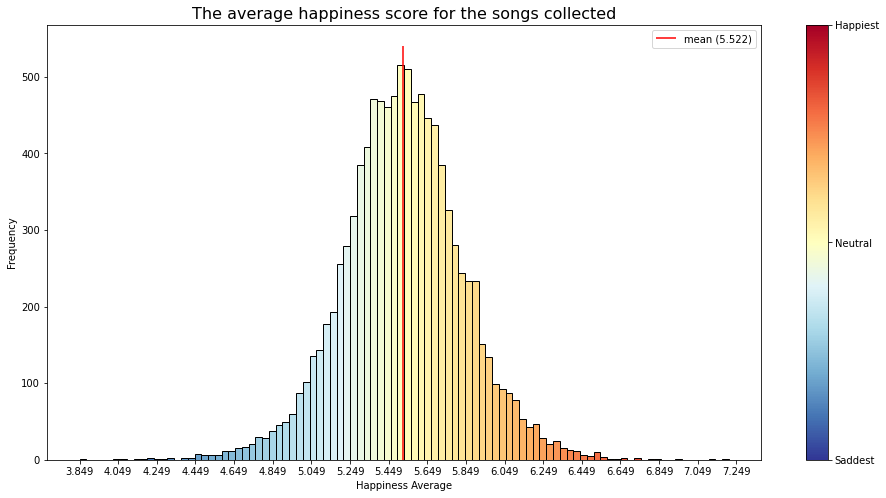

In [30]:
# Histogram of the lyrics sentiment of all songs in the data set
#Use a colormap to color the bins
color_map = plt.cm.get_cmap('RdYlBu_r')

#Find the mean and median
mean = sentiment_df.happiness_average.mean()

fig = plt.figure(figsize = (16,8))
ax = fig.gca()

# Plot histogram.
n, bins, patches = plt.hist(sentiment_df.happiness_average, bins="auto", edgecolor="black")
bin_centers = 0.5 * (bins[:-1] + bins[1:])

ymin,ymax = ax.get_ylim()
plt.vlines([mean],ymin,ymax,color='red')

plt.legend([f'mean ({np.round(mean,3)})'])
plt.ylabel('Frequency')
plt.xlabel('Happiness Average')
plt.title('The average happiness score for the songs collected',fontsize=16)
plt.xticks(np.arange(min(sentiment_df['happiness_average']), max(sentiment_df['happiness_average'])+0.2, 0.2))
plt.grid(False)

# normalize colors
color = bin_centers - min(bin_centers)
color /= max(color)

for c, p in zip(color, patches):
    plt.setp(p, 'facecolor', color_map(c))

# normalize colors
color = bin_centers - min(bin_centers)
color /= max(color)

for c, p in zip(color, patches):
    plt.setp(p, 'facecolor', color_map(c))

#Create colorbar
sm = plt.cm.ScalarMappable(cmap=color_map)
sm._A = []
cb = plt.colorbar(sm)
cb.set_ticks([0.0, 0.5, 1.0])
cb.set_ticklabels(["Saddest", "Neutral", "Happiest"])

plt.show()

**Comment:** The lyrics’ average happiness score resembles a normal distribution, meaning that most songs have a similar happiness average score and very few songs deviate by a lot. We are interested in looking into the most extreme ones and see what differentiates them from the others.

##### 10 happiest songs
The 10 happiest songs are found to detect characteristics that make them happier than others.

In [31]:
sentiment_df.loc[:, ['artist_name','song_name','happiness_average']].nlargest(10, 'happiness_average')

,artist_name,song_name,happiness_average
9303,Jamie xx,Girl,7.209939
6915,Crush,Beautiful,7.116117
7827,Stevie Wonder,Happy Birthday,6.959545
5190,Elvis Presley,Love Me Tender,6.844444
6862,Whitney Houston,I Will Always Love You,6.799074
5537,Majid Jordan,My Love,6.748523
6906,Bing Crosby,Mele Kalikimaka,6.725426
652,Franz Ferdinand,Love Illumination,6.720417
7674,LEE HI,내 사랑 (My Love),6.678144
1650,Sigala,Easy Love,6.674132


**Comment:** Here we can see songs by some music icons like *Stevie Wonder*, *Elvis Presley*, and *Whitney Houston*. For example, the song 'I will always love you' includes some of the highest-ranking happy words like happiness, love, and joy.

##### 10 saddest songs
The 10 saddest songs are found to detect characteristics that make them sadder than others.

In [32]:
sentiment_df.loc[:, ['artist_name','song_name','happiness_average']].nsmallest(10, 'happiness_average')

,artist_name,song_name,happiness_average
4242,TheFatRat,Never Be Alone,3.848986
5997,Jon Bellion,All Time Low,4.036977
8968,French Montana,Ain’t Worried About Nothin’,4.073272
8995,Rammstein,Du hast (English Version),4.146667
1803,21 Savage,Red Opps,4.194030
4306,Korn,Falling Away from Me,4.211287
8134,The Prodigy,Firestarter,4.221667
3106,Marilyn Manson,WE ARE CHAOS,4.234828
604,Famous Dex,Hoes Mad,4.269855
9085,Pixies,Hey,4.306596


**Comment:** Here we can see a mix of different songs by various artists. For example, the song 'WE ARE CHAOS' by *Marilyn Manson* includes a lot of sad words with a minority of happy words like death and sick.

#### Artist average sentiment distribution
The average happiness score for each artist is found by calculating the mean of the artist's songs happiness average.

**Comment:** Here we only consider artists with more 3 or more songs so we can see the difference between the song distribution and artist distributions. 

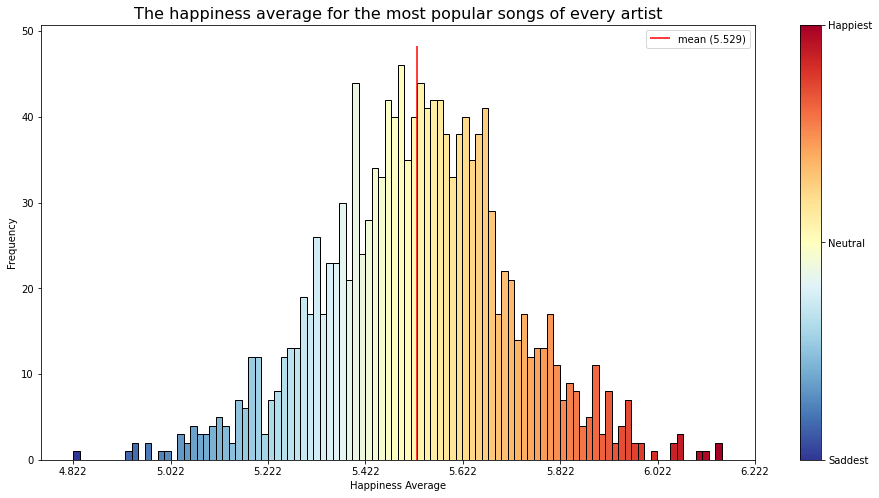

In [33]:
sentiment_df, artist_sentiment_df = calc_artist_avg_happiness(sentiment_df)

#Use a colormap to color the bins
color_map = plt.cm.get_cmap('RdYlBu_r')

mean = artist_sentiment_df.artist_happiness_average.mean()

fig = plt.figure(figsize = (16,8))
ax = fig.gca()

#artist_sentiment_df.artist_happiness_average.hist(ax=ax, bins=100,edgecolor='black')
n, bins, patches = plt.hist(artist_sentiment_df.artist_happiness_average, bins=100, edgecolor="black")
bin_centers = 0.5 * (bins[:-1] + bins[1:])

ymin,ymax = ax.get_ylim()
plt.vlines([mean],ymin,ymax,color='red')

plt.legend([f'mean ({np.round(mean,3)})'])
plt.ylabel('Frequency')
plt.xlabel('Happiness Average')
plt.title('The happiness average for the most popular songs of every artist', fontsize=16)
plt.xticks(np.arange(min(artist_sentiment_df['artist_happiness_average']), max(artist_sentiment_df['artist_happiness_average'])+0.2, 0.2))
plt.grid(False)

# normalize colors
color = bin_centers - min(bin_centers)
color /= max(color)

for c, p in zip(color, patches):
    plt.setp(p, 'facecolor', color_map(c))

#Create colorbar
sm = plt.cm.ScalarMappable(cmap=color_map)
sm._A = []
cb = plt.colorbar(sm)
cb.set_ticks([0.0, 0.5, 1.0])
cb.set_ticklabels(["Saddest", "Neutral", "Happiest"])

plt.show()

**Comment:** Most of the artists seem to be in-between the extremes, therefore, neutral. Some tend to have sadder lyrics while others express more happiness.
    
Further analysis is conducted on the extremes to identify whether there is a pattern between the happiest and saddest artists.

##### The Top 10 artists with the happiest songs
The top 10 artists that express the most happiness and positive emotions in their lyrics are found.

In [34]:
artist_sentiment_df.loc[:, ['artist_name', 'artist_happiness_average']].nlargest(10, 'artist_happiness_average')

,artist_name,artist_happiness_average
5263,Anita Baker,6.154443
7322,Chris Tomlin,6.151096
2018,Carpenters,6.123536
9295,Modern Talking,6.108299
4344,Hillsong Worship,6.064735
835,Kaash Paige,6.064392
1749,Echosmith,6.062355
9629,Jill Scott,6.054556
7274,Monica,6.049143
350,Rick James,6.008227


**Comment:** The happiest artists are a mixture of old-timers like *Carpenters* & *Modern Talking* and contemporary Christian music singers such as *Chris Tomlin* & *Hillsong Worship*.

##### Top 10 artist with the saddest songs
The top 10 artists that express the most sadness and negative emotions in their lyrics are found.

In [35]:
artist_sentiment_df.loc[:, ['artist_name', 'artist_happiness_average']].nsmallest(10, 'artist_happiness_average')

,artist_name,artist_happiness_average
9214,Jasiah,4.822482
972,Machine Head,4.930263
4589,YBN Nahmir,4.950487
2604,Trivium,4.954267
789,Freddie Dredd,4.974024
2997,Sheck Wes,4.976687
6641,Young Nudy,5.005528
8908,Evanescence,5.019704
4966,Xavier Wulf,5.039973
4041,Blueface,5.047243


**Comment:** There is a clear pattern here. The saddest artists are either young rappers in their 20s like *Jashia*, *YBN Nahmir*, *Freddie Dredd*, and *Sheck Wes* or heavy metal bands such as *Trivium* and *Machine Head*. 
By analyzing the happiest and saddest artists it is clear that among the happiest ones are musicians that were famous in the 50s, 60s, and 70s while the saddest ones are young, newcomers in the music industry. 
Therefore, it could be an interesting approach to further analyze sentiment changes over the years. How has lyrical content evolved? Were songs back in the day generally happier than nowadays?

#### Lyrics sentiment over time
First, the decade is found from where the songs were released.

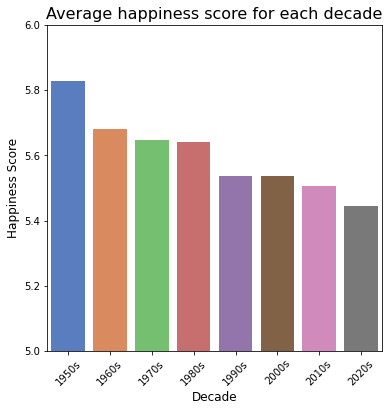

In [36]:
#Retrieve the decade from when the song was released
def get_decade(year):
    year_str = str(year)
    return year_str[0:3] + '0s'

decade_sentiment_df = sentiment_df.copy()
decades = sentiment_df.year.apply(lambda x : get_decade(x))
decade_sentiment_df = decade_sentiment_df.sort_values("year")
decade_sentiment_df['decade'] = decades

# Since the data does not contain many songs before 1950, the songs before 1950 are filtered out.
decade_sentiment_df = decade_sentiment_df[decade_sentiment_df.year >= 1950]

# The average happiness score is calculated or each decade.
decade_sentiment_df['decade_happiness_average'] = decade_sentiment_df.groupby(['decade']).happiness_average.transform('mean')

#The average happiness scores for each decade are visualized with a bar plot.
fig, ax = plt.subplots(figsize=(6,6))
sns.barplot(decade_sentiment_df.loc[:,'decade'],decade_sentiment_df.decade_happiness_average, palette="muted")

ax.set(ylim=[5, 6])
plt.xticks(rotation=45)
plt.title("Average happiness score for each decade", fontsize=16)
plt.xlabel("Decade", fontsize=12)
plt.ylabel("Happiness Score", fontsize=12)
plt.show()
fig.savefig('happiness_decade.svg', format='svg')

**Comment:** There seems to be a downward trend, i.e., the lyrical content is becoming sadder and sadder as the years go by.
    
To further analyze the sentiment changes, a yearly average happiness score is found and visualized. The blue dots represent the songs from the year they were released, and their average happiness score. The red line shows the yearly average happiness score. We include two times the standard deviation on either side of the mean to show whether there are significant changes to the shape of the distribution over time, i.e., to see if more songs today have extremely happy or extremely sad lyrical content compared to older songs.

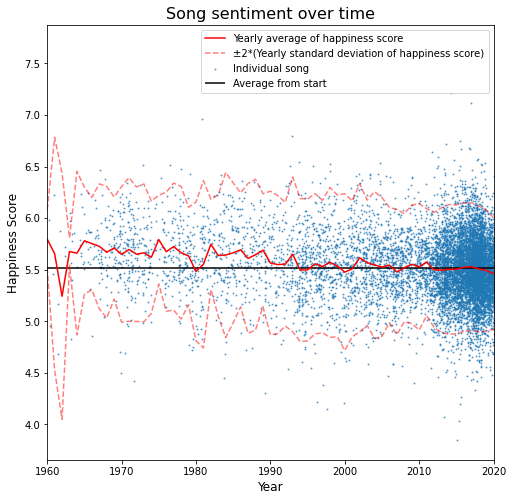

In [37]:
sentiment_df.release_date = pd.to_datetime(sentiment_df.release_date,format='%Y-%m-%d')
sentiment_df_datetime = sentiment_df.copy()
sentiment_df_datetime.index = sentiment_df_datetime.release_date

# visualization
plt.figure(figsize=(8,8))

song = plt.scatter(sentiment_df.loc[:,'release_date'],sentiment_df.happiness_average,alpha=0.6, marker='o', s=1)

ax = plt.gca()

yearly_group_generator = sentiment_df_datetime.loc[sentiment_df_datetime.year>1900,['happiness_average']].groupby(pd.Grouper(freq='1y'))

yearly_mean = yearly_group_generator.mean()
yearly_std = yearly_group_generator.std()

mean = plt.plot(yearly_mean,color='red')
std = plt.plot(yearly_mean+2*yearly_std,color='red',linestyle='--',alpha=0.5)
plt.plot(yearly_mean-2*yearly_std,color='red',linestyle='--',alpha=0.5)

x_start, x_end = datetime.datetime(1960,1,1),datetime.datetime(2020,1,1)
plt.xlim(x_start, x_end)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Happiness Score", fontsize=12)
plt.title("Song sentiment over time", fontsize=16)
mean_line = plt.hlines(np.mean(sentiment_df_datetime.happiness_average),x_start, x_end,color='black')

plt.legend((mean[0], std[0],song,mean_line), ('Yearly average of happiness score', '±2*(Yearly standard deviation of happiness score)', 'Individual song','Average from start'))

plt.show()

**Comment:** The graph shows a slight downward trend. Two explanations come to mind, one being that music has slowly become sadder over time. The other explanation is one of sample bias, i.e. the artists in the data are the ones that are most popular nowadays, therefore, it is lacking older musicians. The standard deviation does not indicate that there has been a change in the extremes, that is, the amount of very happy or very sad songs has not increased over the years.
    
#### Genre sentiment distribution
The average happiness score for each genre is found by calculating the mean of the happiness averages of all the artists belonging to each genre.

The genres that consist of less than 100 songs are removed from the data. For many of the uncommon genres, the dataset only contains a few songs which are not considered sufficient to describe the whole genre. Some artists belong to various genres, however, the most common genre was assigned to each artist as the main genre.

In [38]:
sentiment_df, genre_sentiment_df = calc_genre_avg_happiness(sentiment_df)

#Find genres with less than 100 songs
remove_genre = sentiment_df.groupby("most_freq_genre").filter(lambda x: len(x) < 100)['most_freq_genre'].value_counts()

genre_sentiment_df = genre_sentiment_df[~genre_sentiment_df['most_freq_genre'].isin(remove_genre.index)]
genre_sentiment_df = genre_sentiment_df[genre_sentiment_df['most_freq_genre'] != ""]

##### Top 10 genres by happiness average
The 10 genres with the happiest songs are identified to explore further which characteristics make them happier than other genres.

In [43]:
happiest_genres = genre_sentiment_df.loc[:, ['most_freq_genre', 'genre_happiness_average']].nlargest(10, 'genre_happiness_average')
happiest_genres

,most_freq_genre,genre_happiness_average
495,ccm,5.802704
41,contemporary country,5.660832
1,dance pop,5.599504
992,indie folk,5.566411
69,pop,5.560390
8,rock,5.554113
422,pop rock,5.547593
1135,pop rap,5.510403
442,modern rock,5.468426
236,uk hip hop,5.458735


**Comment:** The happiest genres all seem quite reasonable. The music belonging to the genres are usually “feel good” songs or songs that people like to dance to, for example, electro house, dance-pop, and contemporary country. The happiest genre is contemporary Christian music (ccm) which might not come as a surprise since many of those songs contain high rated happy words such as lord, Jesus, and holy.

##### Top 10 genres with the saddest songs
The 10 genres with the saddest songs are identified to explore further which characteristics make them sadder than other genres.

In [44]:
saddest_genres = genre_sentiment_df.loc[:, ['most_freq_genre', 'genre_happiness_average']].nsmallest(10, 'genre_happiness_average')
saddest_genres

,most_freq_genre,genre_happiness_average
61,underground hip hop,5.236902
296,trap,5.268555
102,alternative metal,5.282432
380,rap,5.384588
9,hip hop,5.403658
6,pop punk,5.438681
236,uk hip hop,5.458735
442,modern rock,5.468426
1135,pop rap,5.510403
422,pop rock,5.547593


**Comment:** The sad genres are sensible. The genres are influenced by dark emotions and the music is often used to express a judgment. Underground hip hop is known for its socially conscious lyrics. Trap gets its name from a slang word that refers to a place where drugs are sold illegally. Alternative metal is driven by aggressive sounds and the lyrics are often progressive.

##### Sentiment distribution for the 10 most common genres
Themes between genres can be very dissimilar. How does lyrical content differ across genres?

Initially, the 10 most common genres are found and sorted according to their average happiness score, i.e., to categorize them as happy or sad genres. The most common genres are found by looking at the 10 genres that most songs in the data belong to.

The sentiment distribution is now visualized with a KDE plot to compare the different types of genres.

We use KDE plot so the displays the relative sentiment distribution within each genre, by considering the average happiness score of every artist belonging to the genre. It can be considered a smooth approximation of a density histogram, i.e. where the area under each distribution sums to 1.

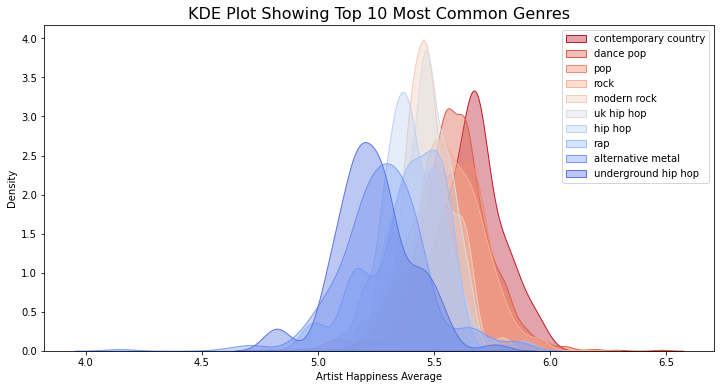

In [45]:
genre_count = sentiment_df.most_freq_genre.value_counts()
biggest_10_genres = genre_count[:10].index
biggest_10_with_happiness = []
for name in biggest_10_genres:
    score = genre_sentiment_df.loc[genre_sentiment_df.most_freq_genre == name].genre_happiness_average.values[0]
    biggest_10_with_happiness.append((name, score))
biggest_10_sorted = [g[0] for g in sorted(biggest_10_with_happiness, key=lambda x: x[1], reverse=True)]

cmap = sns.color_palette("coolwarm", as_cmap=True)
col = cmap(np.arange(0,cmap.N)) 

plt.figure(figsize=(12,6))
i = 250
for genre in biggest_10_sorted:
    sns.kdeplot(data = sentiment_df.loc[sentiment_df.most_freq_genre.isin([genre])],
            x = 'artist_happiness_average',
            legend='most_freq_genre',
            fill=True,
            alpha=0.4,
            color=col[i][:3],)
    i-=25
plt.legend([genre_ for genre_ in biggest_10_sorted])
plt.title("KDE Plot Showing Top 10 Most Common Genres",fontsize=16)
plt.xlabel('Artist Happiness Average')
plt.show()

**Comment:** The blue genres are the sadder genres, where underground hip hop is the saddest. Modern rock is kind of neutral, between the saddest and happiest genres. The red genres are the happier ones, with contemporary country as the happiest. It can be seen that *underground hip hop* and *contemporary country* are very dissimilar.

##### VADER sentiment analysis on the 3 happiest and 3 saddest genres
Further sentiment analysis is conducted on the 3 happiest and 3 saddest genres by using NLTK's sentiment analysis tool, VADER. It used to see the difference in the negative and positive valence between the lyrical content of the 3 happiest and 3 saddest genres.

Initially, VADER is used to find the proportion of negative, positive, and neutral words in each song lyric. Only the 3 happiest and 3 saddest genres are considered.

In [46]:
vader_sentiment_df = sentiment_vader_lyrics(sentiment_df)

happiest_3_genres = list(happiest_genres.most_freq_genre[:3].values)
saddest_3_genres = list(saddest_genres.most_freq_genre[:3].values)
happiest_saddest = happiest_3_genres + saddest_3_genres

# Create dataframes with the 3 happiest genres and 3 saddest genres and one combined
happiest_3_df = vader_sentiment_df[vader_sentiment_df['most_freq_genre'].isin(happiest_3_genres)]
saddest_3_df = vader_sentiment_df[vader_sentiment_df['most_freq_genre'].isin(saddest_3_genres)]
happy_sad_df = vader_sentiment_df[vader_sentiment_df['most_freq_genre'].isin(happiest_saddest)]

# A color map is created where the happy genres are assigned bright colors while the sad genres get cold colors.
#Create color maps for the happiest/saddest genres
color_map = []
sad_happy = []
for genre, row in vader_sentiment_df.groupby('most_freq_genre'):
    if genre in happiest_3_genres:
        color_map.append("#F45D51")
        sad_happy.append(f"{genre} (happy genre)")
    if genre in saddest_3_genres:
        color_map.append("#5182F4")
        sad_happy.append(f"{genre} (sad genre)")
        


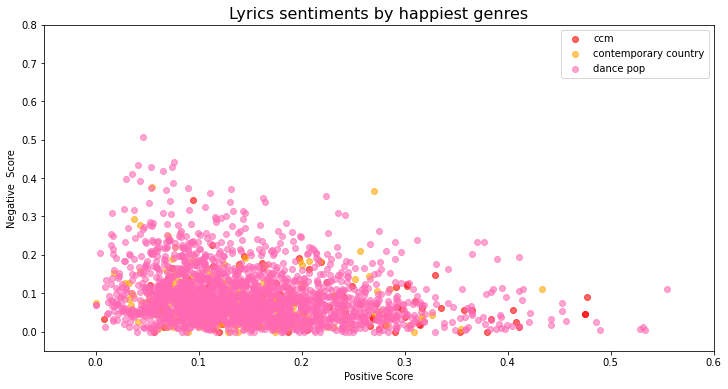

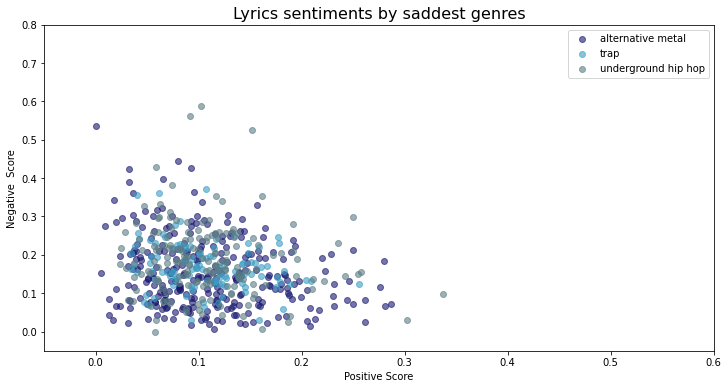

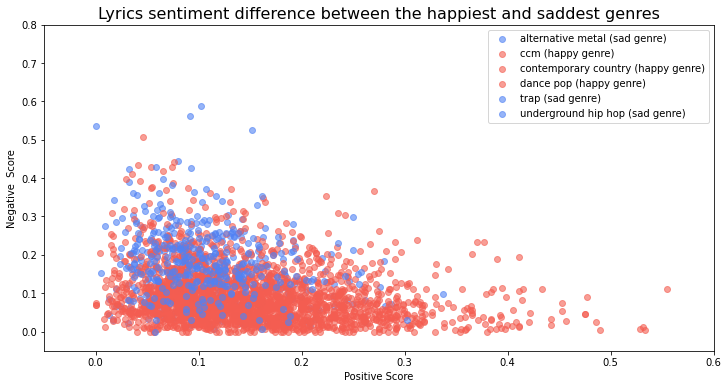

In [47]:
# The VADER outcomes are plotted to analyse the dissimilarities in 
# positive/negative valence in lyrics between the happiest and saddest genres.
plt.figure(figsize=(12,6))

i=0
color = ["#FF0000", "#ffa500", "#FF69B4"]
for genre, column in happiest_3_df.groupby('most_freq_genre'):
    m = [i for x in range(len(column["positive"]))]
    plt.scatter(column['positive'],column['negative'],label=genre, alpha=0.6, c=color[i])
    plt.legend()
    i+=1
plt.title("Lyrics sentiments by happiest genres",fontsize=16)
plt.xlabel('Positive Valence')
plt.ylabel('Negative  Valence')
plt.xlim([-0.05,0.6])
plt.ylim([-0.05,0.8])

plt.show()

plt.figure(figsize=(12,6))

i=0
color = ["#191970", "#3b9dc3", "#5b7c85"]
for genre, column in saddest_3_df.groupby('most_freq_genre'):
    m = [i for x in range(len(column["positive"]))]
    plt.scatter(column['positive'],column['negative'],label=genre, alpha=0.6, c=color[i])
    plt.legend()
    i+=1
plt.title("Lyrics sentiments by saddest genres", fontsize=16)
plt.xlabel('Positive Valence')
plt.ylabel('Negative  Valence')
plt.xlim([-0.05,0.6])
plt.ylim([-0.05,0.8])

plt.show()

plt.figure(figsize=(12,6))

for (genre, column), c in zip(happy_sad_df.groupby('most_freq_genre'), color_map):
    plt.scatter(column['positive'],column['negative'],label=genre, alpha=0.6, c=c)
    plt.legend([f'{word}' for word in sad_happy])
plt.title("Lyrics sentiment difference between the happiest and saddest genres", fontsize=16)
plt.xlabel('Positive Valence')
plt.ylabel('Negative  Valence')
plt.xlim([-0.05,0.6])
plt.ylim([-0.05,0.8])

plt.show()

**Comment:** Each dot represents a song. The song is placed on the plot according to the porpotion of negative and positive words in the lyric of all the words within the song. When analyzing the plots, many of the songs belonging to the saddest and happiest genres have similar negative and positive valence. However, there seems to be a trend towards more negative valence with the songs in the saddest genres and vice versa. Only a few songs of the happiest genres have a negative valence over 0.2 (meaning that over 20% of all the words within the lyric are negative) while approximately half of the songs from the saddest genres have a negative valence of 0.2 or higher. However, the majority of the lyrical content in the songs in both the happiest and saddest genres are neutral terms.

### Discussion

#### LabMT wordlist
**Sentiment analysis on songs & artists**

By using the average happiness score for common words in the LabMT wordlist we were able to categorize songs and artists according to their average happiness score. Apparent patterns were discovered. The happier songs and artists involve lyrics about e.g., 'love' while the sadder songs and artists focus more on expressing a judgment with harsh language.

**Lyrics sentiment over time**

The changes in lyrical sentiment seem to have a downward trend, meaning that the lyrical content of songs has become sadder over the years. However, this could be due to sample bias. Because we chose artists based on popularity and number of followers today it might just be that people who listen to older musicians like to listen to happier musicians rather than the sadder ones.
At first glance, it seems that the newer music exists more in both extremes than the older music, but looking at the standard deviation we see that this is likely not the case. We may simply be seeing more extreme songs because we have more new songs in our dataset than old ones.

The two possible conclusions remain.
- On average, it’s the happier songs that live on
- Music has seen a slow and steady decline to sadder and sadder lyrics.

**Sentiment analysis on genres**

The analysis depicts sentimental differences between different genres. Some genres, like *underground hip hop* and *alternative metal*, tend to be sadder which is logical as the lyrics are often very progressive and socially conscious, using derogatory terms. The happiest genres often include more "feel good" songs where emotions are expressed in a more respectful way.

#### VADER
The outcome when applying VADER shows that there are patterns within the most extreme genres. The happiest genres rarely include negative words in their lyrics, i.e., the proportion of negative words is at a minimum. The same goes for songs in the saddest genre, i.e., the proportion of negative words is much higher than of positive words within the lyrical content. However, the majority of the lyrical content in the songs in both the happiest and saddest genres are neutral terms.

<a id='3-2'></a>
# 3.2 Community Detection

### What we're interested in
We want to detect and partition the network into communities using a community detection algorithm. We then want to add the detected communities as node attributes to the network and save the networks so that they can be visualized in Gephi, which is a vialuzation tool (more on that below). The results will then be put on the website.

We want to perform the community partitioning and save the networks for both the complete network with all of the top artists and the giant connected component. As they are both used in the narrative on the website.

### How it works
We start by recreating the network according to the beforementioned criteria. In addition, we remove the isolated nodes as they cannot be included in the visualization in a meaningful way.

To gain more insights into the music industry network, community detection is applied using the Louvain method. The algorithm works in the following way:

1. First each node is assigned to its community (i.e. each node is its community). Then for each node, a change in modularity is computed by removing the node from its community and moving it into the community of each of its neighbours.
2. Then every node is placed into the communities in which they ended last time. Then each community is treated as a single node and the connections between the nodes are used in the communities as weighted edges between the new nodes.

Then it starts over using the aggregated community from before as the new network.
### Applying it to the data

#### Helper functions
- <code>get_top_artists_df</code>: Returns the top artists to work with. 
    - The top artists is the union of the top 3000 artists by followers and top 3000 artists by popularity.

- <code>get_community_name</code>: Creates a name for a community from the artists name
    - The name is determined by the top 3 most followed artists in that community.

- <code>create_network_without_attributes</code>: Creates the network for a given artist dataframe. Artist names are used as nodes instead of indexes as it is more convenient when the network has been split up into communities.

- <code>recreate_with_community_attribute</code>: Recreates the network with the attributes. The resulting network is then exported to the Gephi visualization tool.
    - The network is created twice so the community partition can be included as an attribute when the visualization is done.

- <code>get_sentiment_value</code>: Gets the sentiment value for a given artist name. This is used to add an artist's happiness average as an attribute to the network.
- <code>get_community_name_by_artist</code>: Finds the name of the community that an artist belongs to. This is used for adding a community as an attribute to the network.

In [48]:
def get_top_artists_df(artists):
    top_popularity = artists.sort_values('popularity',ascending=False).iloc[:3000]
    top_followers = artists.sort_values('followers',ascending=False).iloc[:3000]
    top_both = artists.loc[top_popularity.index.union(top_followers.index)]

    return top_both


def get_community_name(name_list, artists):
    name_list_followers = []
    for name in name_list:
        if name in artists.name.values:
            followers = artists.loc[artists.name == name].followers.values[0]
            name_list_followers.append((name, followers))

    name_list_followers = sorted(name_list_followers, key=lambda x: x[1], reverse=True)
    three_most_followed_artists = [artist for artist, followers in name_list_followers[:3]]

    return ' | '.join(three_most_followed_artists)

def create_network_without_attributes(artists):
    G = nx.DiGraph()
    node_data_list = [name for name in artists.name.values]
    id_to_name = {index:name for index,name in artists.loc[:,['name']].iterrows()}
    G.add_nodes_from(node_data_list)
    edges_to_add = []
    for x, y in edges.loc[:,['from', 'to']].values:
        try:
            name_x = id_to_name[x]
            name_y = id_to_name[y]
            if len(name_x) > 0 and len(name_y) > 0:
                if name_x[0] in node_data_list and name_y[0] in node_data_list:
                    edges_to_add.append((name_x[0], name_y[0]))
        except:
            pass
    G.add_edges_from(edges_to_add)
    G.remove_nodes_from(list(nx.isolates(G)))
        
    return G

def recreate_with_community_attribute(G, artists):
    G_viz = nx.DiGraph()
    nodes_to_add = list()
    edges_to_add = list()
    node_list = G.nodes

    for index, row in artists.iterrows():
        name = row['name']

        if name in node_list:
            attributes = {
                'popularity' : artists.at[index, 'popularity'],
                'followers' : artists.at[index, 'followers'],
                'happiness_avg' : float(get_sentiment_value(name)),
                'community' : str(get_community_name_by_artist(partition_dict, name)) 
            }
            nodes_to_add.append((name, attributes))

    id_to_name = {index:name for index,name in artists.loc[:,['name']].iterrows()}
    edges_to_add = []
    for x, y in edges.loc[:,['from', 'to']].values:
        try:
            name_x = id_to_name[x]
            name_y = id_to_name[y]
            if len(name_x) > 0 and len(name_y) > 0:
                if name_x[0] in node_list and name_y[0] in node_list:
                    edges_to_add.append((name_x[0], name_y[0]))
        except:
            pass

    G_viz.add_nodes_from(nodes_to_add)
    G_viz.add_edges_from(edges_to_add)
    
    return G_viz

def get_sentiment_value(name):
    happiness_avg = artist_sentiment_df.loc[artist_sentiment_df.artist_name == name].artist_happiness_average.values
    if len(happiness_avg) > 0:
        return happiness_avg[0]
    return 0

def get_community_name_by_artist(partition_dict, artist_name):
    for k, v in partition_dict.items():
        if artist_name in v:
            return k
    return ""


#### Communities within the entire network subset

In [50]:
# Create a dataframe with using the subset of most followed/popular artists.
top_artists = get_top_artists_df(artists)

# Create the complete network without attributes
G = create_network_without_attributes(top_artists)

# Partition the whole network into communities using the Louvain algorithm.
partition = community.best_partition(nx.to_undirected(G),random_state=1)

partition_counts = pd.Series(list(partition.values())).value_counts()
communities_size_order = partition_counts.index.values

# Find the names within each community/partition
partition_dict = dict()
for i in communities_size_order:
    partition_list = []
    for key in partition.keys():
        if partition[key] == i:
            partition_list.append(key)
    # We name each community by its three most connected characters.
    community_name = get_community_name(partition_list, top_artists)
    partition_dict[community_name] = partition_list
    
print(f'There are {len(communities_size_order)} communities in total for the whole network.')

There are 63 communities in total for the whole network.


In [52]:
#Recreate the network, this time with attributes. Now the community can be included as an attribute for each node.
G_viz = recreate_with_community_attribute(G, top_artists)

# Now that we have the complete network with the community names
#     as an attribute we save it as an .gexf file. 
# That file is then used in the visualization tool Gephi for 
#     creating the networks on the website.
nx.write_gexf(G_viz, './Data/Networks/artist_graph.gexf')

#### Communities within the GCC of the network subset

In [53]:
# First, we find the largest connected component.
gcc = G.subgraph(max(nx.weakly_connected_components(G),key=len))

# Next we will perform the community detection again on the GCC
partition = community.best_partition(nx.to_undirected(gcc),random_state=1)

# Nameing the communities as the 3 most followed artist in each community. 
partition_counts = pd.Series(list(partition.values())).value_counts()
communities_size_order = partition_counts.index.values

# Find the names within each community/partition
partition_dict = dict()
for i in communities_size_order:
    partition_list = []
    for key in partition.keys():
        if partition[key] == i:
            partition_list.append(key)
    # We name each community by its three most connected characters.
    community_name = get_community_name(partition_list, top_artists)
    partition_dict[community_name] = partition_list

print(f'There are {len(communities_size_order)} communities in total for the giant connected component.')

There are 32 communities in total for the giant connected component.


In [55]:
# Saving the GCC communities to file to use in Gephi
nx.write_gexf(gcc, './Data/Networks/artist_graph_gcc.gexf')

#### Distribution of community sizes
Finally, we will look further into the results of our community detection by plotting the results.

It is important to note that the following figure will be different from the one on the website, as the community partition doesn't yield the same results in each run.

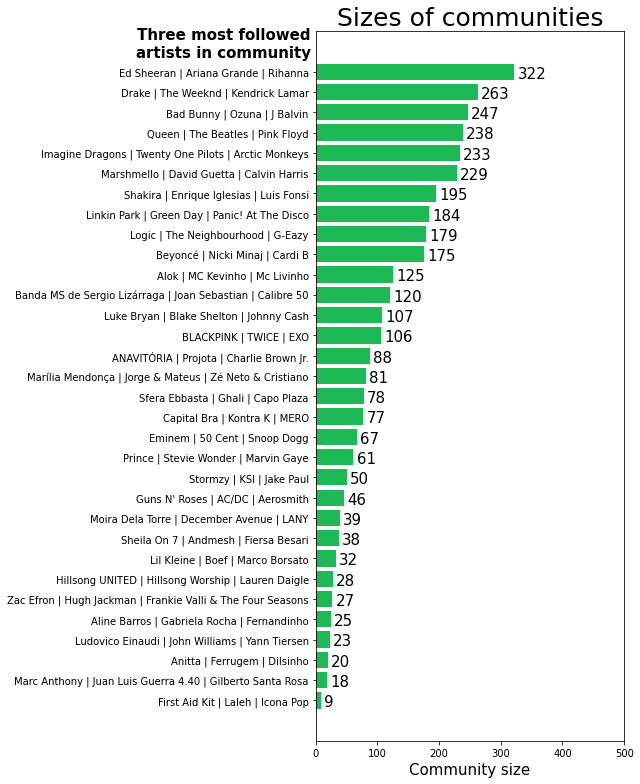

In [56]:
plt.figure(figsize=(9,11))
names = list(partition_dict.keys())[::-1]
values = list(partition_counts.values)[::-1]
plt.barh(names,values,color='#1DB954')
for n,(value,index) in enumerate(zip(values, names)):
    plt.text(value+5,n-0.3,str(value),fontsize=15)

plt.ylabel('Three most followed\nartists in community',fontsize = 15, rotation=0, labelpad=35, fontweight='bold')
plt.xlabel('Community size', fontsize = 15)
plt.title('Sizes of communities',fontsize=25)
plt.xlim(0,500)
plt.gca().yaxis.set_label_coords(-0.30,0.96)
plt.tight_layout()
plt.savefig('community_sizes.svg',format='svg')
plt.show()

### Community detection outcome discussion
We were very satisfied with the results of the community detection. As the louvain algorithm produces a non-deterministic results, the resulting communities differ in each run.

However, it is apparent that the detected communities consistently follow the type of music an artist creates. That is, in each run the communities are genre related. For example, in each run there are separate communities with pop, rap, hip hop, and rock genres.


<a id='3-3'></a>
# 3.3 TF-IDF

### What we're interested in
We want to turn our tokenized data into numerical data we can work with. Specifically, we're interested in two use-cases here: word clouds for specific genres and topic extraction with NMF. Both of these work best if, for each song, we have an estimate of the relative importance of each word. For this TF-IDF is a good tool to use. 

### TF-IDF - how it works 
TF-IDF stands for term frequency-inverse document frequency and is a metric for the relative importance of a word in a given song. It considers how many times the word appears in the given song (term frequency) as well as how many other songs the word appears in (document frequency). The more common the word, the less important it is, the more often the word appears, the more important it is. 

**The scheme we used:** We realized that in music we often see a much higher term frequency than in other documents because of the repetitive nature of music. If a song is about love and the term 'love' appears in the chorus, it can appear 5-20 times in the whole song, so a linear weight scheme is admittedly biased towards repetitive songs. On the other hand, if we used a binary weight scheme to compute term-frequency, we'd also get a bias, but instead a bias towards long songs, and in those long songs, we'd have equal term frequency for all the words and the weight would only be decided from the inverse document frequency. We did end up using the linear term frequency weight scheme simply because we were happy with the results. 

For the inverse document frequency, we used the standard log version, I.e. $log(N/n_t)$ to reduce the effect of the words that give almost no contextual information for the document since they appear in many documents.  

So, the formula for our tf-idf value is:

${\displaystyle f_{t,d}\cdot \log {\frac {N}{n_{t}}}}$

where $f_{t,d}$ is the term frequency (t) in the document (d). N is the total number of documents and $n_t$ is document frequency

### Helper functions

In [57]:
def compute_TF(corpus,document_names):
    TF_series = [pd.Series(document).value_counts() for document in corpus]
    TF_series_df = pd.concat(TF_series,axis=1)
    TF_series_df.columns = document_names
    
    return TF_series_df

def compute_TF_IDF(word_list_dict,document_names):
    # Term Frequency (raw_count)
    TF_df = compute_TF(word_list_dict,document_names)
    # Compute the document frequency - i.e., count the number of documents that contain each word
    IDF_weight = (TF_df>0).sum(axis=1)

    # Total number of documents
    N = TF_df.shape[1]

    # Compute IDF
    IDF_df = np.log(N/(IDF_weight))    

    # Compute TF-IDF    
    TF_IDF_df = TF_df*IDF_df.values.reshape(-1,1)
    TF_IDF_df = TF_IDF_df.fillna(0)
    return TF_IDF_df

### Applying TF-IDF

In [58]:
complete_song_names = [f'{x} - {y}' for x,y in zip(df_tokenized.loc[:,'artist_name'].values,
                                                   df_tokenized.loc[:,'song_name'].values)]
TF_IDF = compute_TF_IDF(df_tokenized.loc[:,'tokenized_filtered'].values,complete_song_names)

### Discussion

It's hard to tell much about the quality of the TF-IDF data frame except in looking at the results of both the word clouds and NMF, which both worked out really well, so we were very happy with the results from using TF-IDF

<a id='3-4'></a>
# 3.4 Word-clouds for TF-IDF visualizations

### What we're interested in
The reason to use word clouds is to visualize the relative importance of words with numbers attached to them. Word clouds are a visually appealing way to get a sense of weighted text results. The weights we're using are TF-IDF which, as discussed above, is supposed to preserve the relative importance of words given their frequency in a song relative to the word frequency in the whole document corpus. We'll then aggregate the values from songs belonging to a specific genre and check to see if the word clouds make sense given what we know and expect


### Word clouds
We use a package in python called <code>wordcloud</code>, which takes in a dictionary where the keys are supposed the be individual words and the values their weight. For some images, we also specify things like a mask we want the word cloud to fit into and we'll usually specify color and fonts to emphasize the specific genre 

### Helper functions
- <code>generate_inverse_genre_dicts</code>: Creates dictionaries which take in genre name and return list of IDs or names
- <code>genres_with_keyword</code>: create list of all genres with the keyword in it 
- <code>enerate_masked_word_cloud</code>: Creates a word cloud with the td_idf_series given within the mask given
- <code>genre_word_cloud</code>: Aggregate function which generates a wordcloud using all genres that contain the given keyword
    1. Group all genres with 'country' in their name for example
    2. Get a list of all country bands
    3. Get a list of all songs in the TF_IDF dataframe which start with the band name
    4. Get the subset of the TD_IDF dataframe for the selected songs
    5. (here without normalizing each artist first) compute the mean TF_IDF value for each genre
    5. Use the word cloud helper function to generate a word cloud

In [59]:
def generate_inverse_genre_dicts():
    genres_by_count = pd.read_csv(url_genres_by_artist_count,index_col = 0)
    genre_to_artist_id_dict = {genre:[] for genre in genres_by_count.index}
    genre_to_artist_name_dict = {genre:[] for genre in genres_by_count.index}

    for artist_id in genre_dict.keys():
        artist_genres = genre_dict[artist_id]
        for genre in artist_genres:
            genre_to_artist_id_dict[genre].append(artist_id)
            genre_to_artist_name_dict[genre].append(artists.at[artist_id,'name'])
    return genre_to_artist_id_dict,genre_to_artist_name_dict

def genres_with_keyword(keyword):
    keyword_genre_names = []
    for artist in genre_dict.keys():
        genres = genre_dict[artist]
        for genre in genres:
            if (keyword in genre) & (genre not in keyword_genre_names):
                keyword_genre_names.append(genre)
    return keyword_genre_names

def generate_masked_word_cloud(tf_idf_series,
                               mask,
                               song_name='unnamed wordcloud',
                               colormap = 'Blues',
                               contour_color='steelblue',
                               font_path = None):
    song_tf_idf_dict = {key:value for key,value in tf_idf_series.iteritems()}
    wc = WordCloud(font_path=font_path, collocations=False, background_color='white',
                   colormap=colormap,
                   mask=mask,
                   contour_width=8,
                   relative_scaling=0.1,
                   contour_color=contour_color)
    wc.generate_from_frequencies(song_tf_idf_dict)

    plt.figure(figsize=(10,10))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(song_name, fontsize=30,color = contour_color)
    
    return wc


def genre_word_cloud(TF_IDF_df,genre_name,mask,colormap = 'Blues',contour_color='steelblue',exact=True,font_path = None):
    if exact:
        sub_genres = [genre_name,'ððð']
        genre_singers = genre_to_artist_name_dict[genre_name]
    else:
        sub_genres = genres_with_keyword(genre_name)
        print(f'3 sample subgenres: {sub_genres[:3]}')
    
        genre_singers = np.unique(np.sum(np.array([genre_to_artist_name_dict[x] for x in sub_genres],dtype=object)))
    print(f'3 sample bands: {genre_singers[:3]}')

    # Find all the songs by these artists in the dataframe
    songs = [song_name_id for song_name_id in TF_IDF_df.columns if any([song_name_id.startswith(band_name) for band_name in genre_singers])]
    # Get the columns for all the songs by these bands
    TF_IDF_df_subset = TF_IDF_df.loc[:,songs]
    
    # compute the mean lyrics of the genre using TF_IDF weights
    mean_genre_song = TF_IDF_df_subset.mean(axis='columns')

    if type(mask) == type(None):
        mask = np.full((2000,2000),1)
    return generate_masked_word_cloud(mean_genre_song,mask,f'{genre_name} wordcloud',colormap,contour_color,font_path)

### Creating word clouds

1. We must first give each song equal weight since TF-IDF is otherwise larger for larger songs
2. We generate a dictionary such that we can get insert a given genre and get out a list of artists and therefore we can find all songs by said artists to aggregate the songs within each genre

In [60]:
for song in TF_IDF.columns:
    TF_IDF.loc[:,song] = TF_IDF.loc[:,song]/TF_IDF.loc[:,song].sum()
genre_to_artist_id_dict,genre_to_artist_name_dict = generate_inverse_genre_dicts()

**Comment:** We wanted to use a smiley face and a sad face as masks for the word clouds with the least and most sentiment to highlight the differences and so not every word cloud would look exactly the same. Here we're using the smiley and sad faces created in MS-Paint to create masks compatible with the word cloud package

In [61]:
image_happy = cv2.cvtColor(np.array(Image.open(url_image_happy)), cv2.COLOR_BGR2GRAY)
image_sad   = cv2.cvtColor(np.array(Image.open(url_image_sad)), cv2.COLOR_BGR2GRAY)

image_happy[image_happy>150] = 255
image_happy[image_happy<=150] = 1
image_sad[image_sad>150] = 255
image_sad[image_sad<=150] = 1

#### Happy word cloud

3 sample bands: ['Chris Howland', 'Chris Renzema', 'Jervis Campbell']


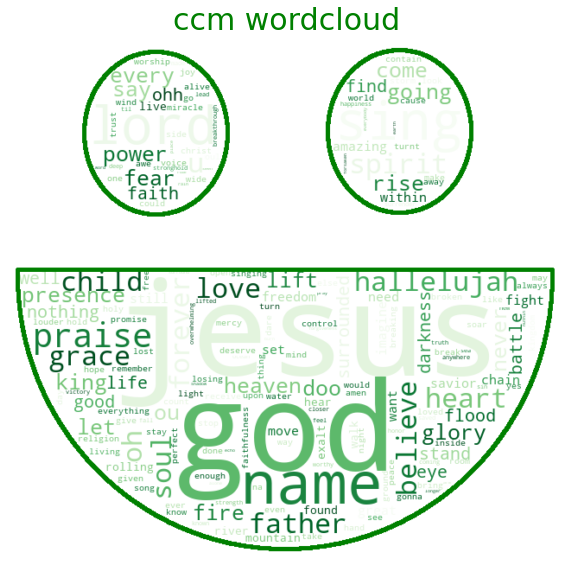

In [62]:
wc_happy = genre_word_cloud(TF_IDF,'ccm',image_happy,'Greens','green',exact=True)
plt.savefig(f'{url_wordcloud_folder}happy.svg',format='svg')
plt.show()

3 sample bands: ['Pusha T', 'KIDS SEE GHOSTS', 'ScHoolboy Q']


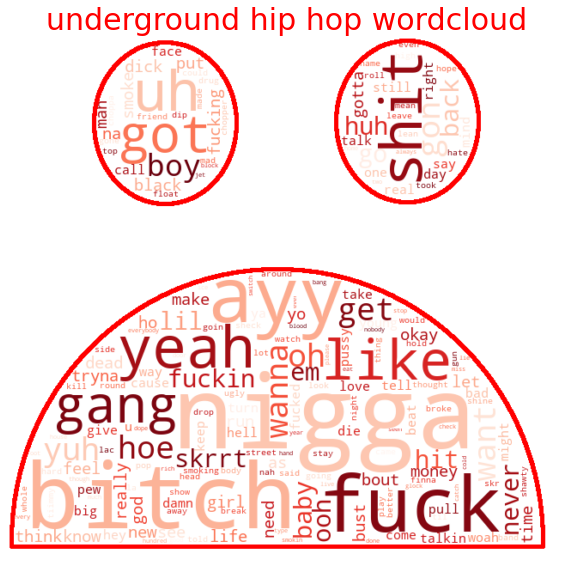

In [63]:
wc_sad = genre_word_cloud(TF_IDF,'underground hip hop',image_sad,'Reds','red',exact=True)
plt.savefig(f'{url_wordcloud_folder}sad.svg',format='svg')
plt.show()

**Comments:**
The word clouds definitely tell a story. The ccm word cloud is filled with religious words and the underground hip hop word cloud is filled with curse words and derogatory terms. However, most genres are probably not as extreme as these two cases. Let’s look at 10 dissimilar genres from the top 25 most popular ones and try to see if the themes make sense. 


### Word clouds for genres
First, we want to pick 10 dissimilar genres of the top 25. Then for each genre, we want to pick a reasonable color and font for the image so the word clouds emphasize the expected characteristics of the genre.

In [64]:
print(list(genre_to_artist_name_dict.keys())[:25])


['rock', 'dance pop', 'pop', 'electro house', 'edm', 'hip hop', 'pop dance', 'latin', 'rap', 'pop rock', 'modern rock', 'pop rap', 'indie rock', 'calming instrumental', 'indie folk', 'indie pop', 'latin rock', 'electropop', 'french hip hop', 'underground hip hop', 'classical performance', 'country rock', 'funk', 'urban contemporary', 'tropical']


In [65]:
selected = ['rock','pop','electro house','hip hop','rap','modern rock','indie rock','country rock','funk']
colors_letters = ['gray','Blues','cool','YlOrRd_r','Greens','Greys','Oranges','gnuplot','Purples']
colors_outline = ['black','blue','yellow','gold','green','grey','orange','brown','purple']
fonts = [url_rock_font,url_pop_font,url_electro_house_font,url_hip_hop_font,url_rap_font,url_modern_rock_font,url_indie_rock_font,url_country_rock_font,url_funk_font]

3 sample bands: ['X Ambassadors', 'TV On The Radio', 'Wallows']


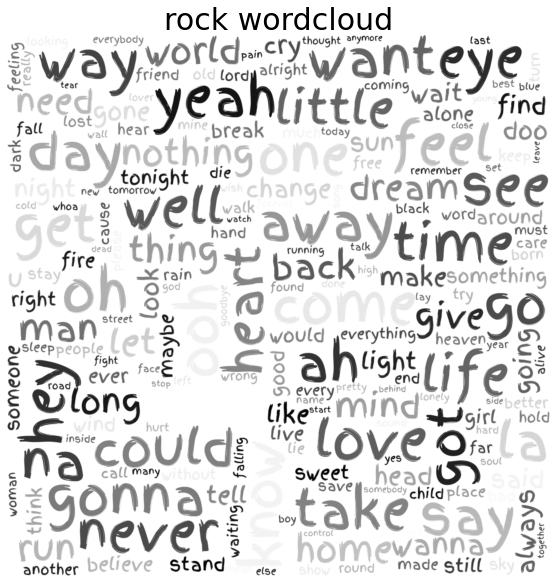

3 sample bands: ['Frank Ocean', 'Wale', 'Ty Dolla $ign']


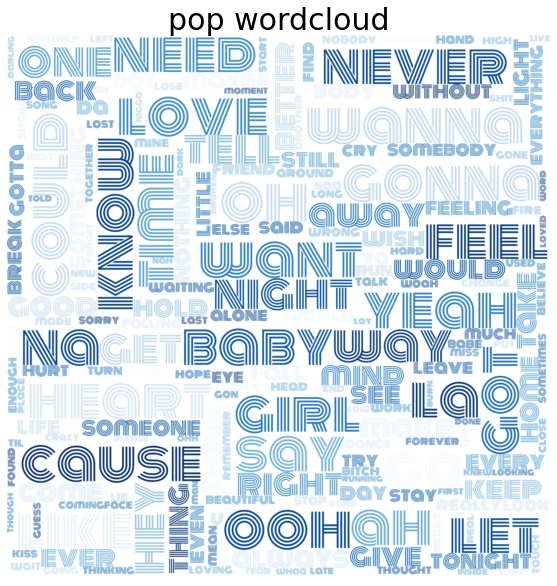

3 sample bands: ['Carnage', 'Just A Gent', 'What So Not']


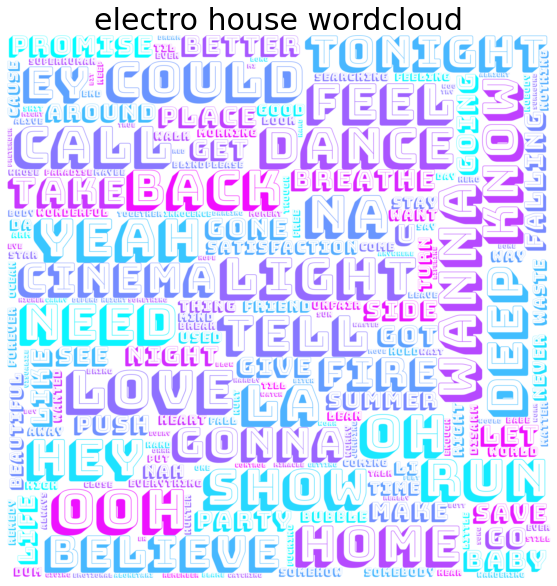

3 sample bands: ['Pusha T', 'KIDS SEE GHOSTS', 'Kid Cudi']


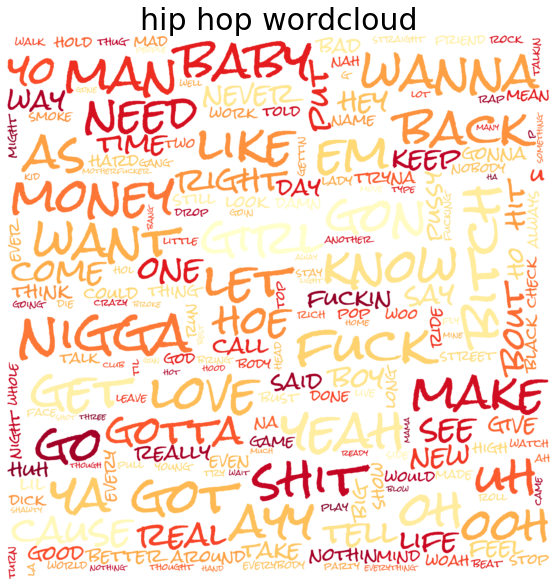

3 sample bands: ['Pusha T', 'KIDS SEE GHOSTS', 'Kid Cudi']


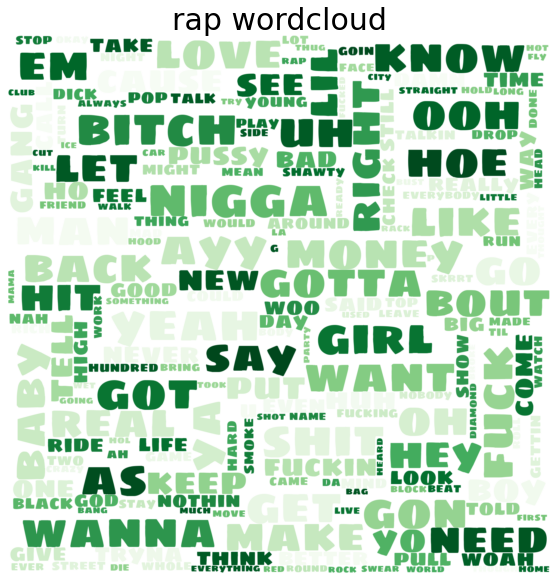

3 sample bands: ['Animal Collective', 'Roy Blair', 'Briston Maroney']


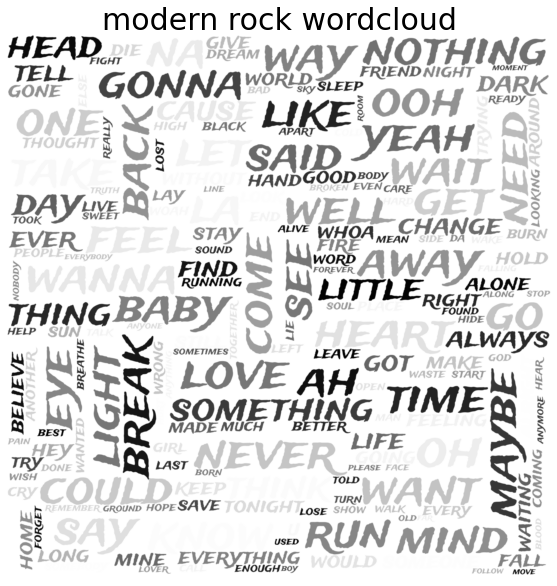

3 sample bands: ['The Microphones', 'Animal Collective', 'Panda Bear']


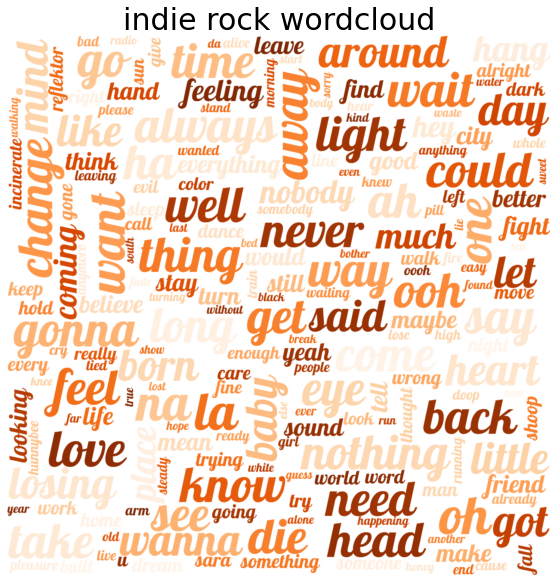

3 sample bands: ['John Cale', 'Lee Hazlewood', 'Big Star']


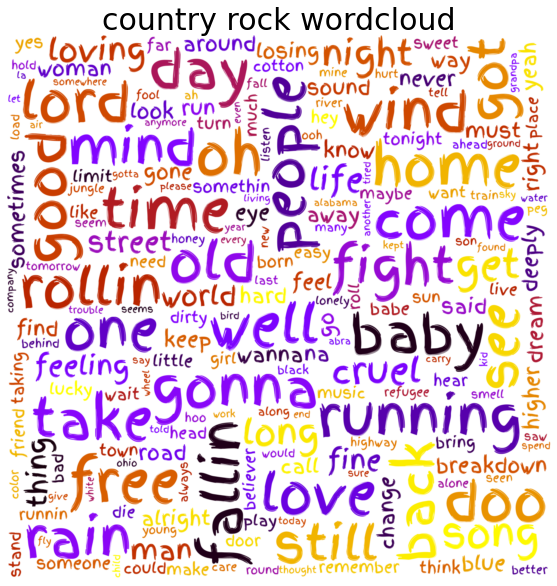

3 sample bands: ['Madlib', 'Aaron Taylor', 'Raphael Saadiq']


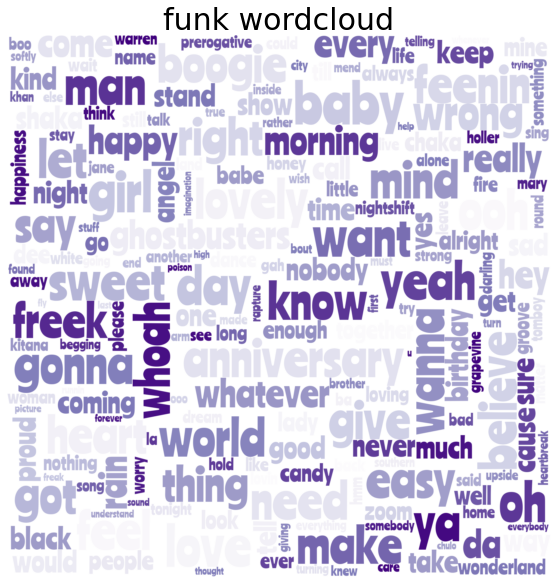

In [66]:
for genre,c1,c2,font in zip(selected,colors_letters,colors_outline,fonts):
    
    genre_word_cloud(TF_IDF,genre,None,c1,'black',exact=True,font_path=font)
    plt.savefig(f'{url_wordcloud_folder}{genre}.svg',format='svg')
    plt.show()

### Word cloud discussion

We were very happy with the results from the word clouds and although every single one made sense for their given genre. For example, the words 'boogie', 'baby', and 'freek' in the funk genre were definitely not out of place. The same for the words 'feel', 'tonight' and 'dance' in the electro house genre.

<a id='3-5'></a>
# 3.5 Topic extraction with NMF

### What we're interested in
What we wanted to do with NMF was to try to extract specific topics from the lyrical data. We wanted to see if the topics we extracted were reasonable and then wanted to show them as word clouds. We expected these to be exaggerated song types with very similar words appearing, which might be even more specific than that of the genre word clouds. 

### The tool 

**Formal description of NMF**

Non-negative matrix factorization (NMF) is a matrix-decomposition method useful for finding intepretable low-dimensional representations of high-dimensional data. We chose to use the frobenius norm as a loss function and so the objective of the method is to solve the following problem:

$$
(\bar{W},\bar{H}) = {argmin\atop{W,H}}||{X-WH}||_F^2
$$

Where $X$ is our $(n_{words}\times n_{songs})$ data matrix, which we assume contains only non-negative values, $\bar{W}$ and $\bar{H}$ are $(n_{words}\times p_{topics})$ and $(p_{topics}\times n_{songs})$ matrices, whose matrix product is an approximation of the original data matrix. This approximation is made subject to non-negativity constraints:

$$
W,H \geq 0
$$

These constraints produce a 'parts-based' representation of the data. This means that we would assume each song is comprised of several parts and these parts are shared between the songs. This method is not optimal for data compression like principal-component analysis or separation of unique sources like independent component analysis but is a very useful method for interpretation because the non-negative factors are usually useful to gain new insight into data. 

### Intuitive explanation of NMF

Non-negative matrix factorization (NMF) is a method designed to extract reasonable patterns or parts from high-dimensional data. In the case of topic extraction from text or lyrics in our case, it will produce two matrices either of which we can interpret in interesting ways. These matrixes are supposed to be able to recreate the original data by first trying to estimate what patterns there exist in the data and then by trying to estimate how much of each pattern exists in each song. The patterns in this case can be seen as lyrical themes or topics. An example of which might be a 'love song' topic or a 'nostalgic' topic. Such a topic would be described as a set of weights for each word. The higher the weights, the more likely the word is to be present in the topic. For the 'love song' topic, we might expect to see high weights for words such as 'love', 'miss', and 'need' since these are common in such songs. 

Just like each topic is described by a set of words, so is each song described by a set of topics. We might see a song about missing a person the author used to love from when they were young. For such a song we might see that the 'love song' and 'nostalgic' topics both have high weights since the song is about something which neither topic fully encapsulates, but both describe to some degree.


![NMF](https://raw.githubusercontent.com/goh12/socialdataanalysis2020-screenshots/master/sgi/tf-idf.png)


### What we're going to do with NMF

We're going to try to extract some themes from the TF-IDF data frame and then select a few reasonable topics from the list by looking at the top 10 words with the highest weights for each topic. Then we're going to look at some word clouds of these topics to see if they seem reasonable.


In [67]:
X = TF_IDF.values.T
X = X/X.sum(axis=1).reshape(-1,1)

nmf = NMF(30,random_state=40)
nmf.fit(X)
topics = nmf.components_

nmf_topic_weights = pd.DataFrame(topics.T,index=TF_IDF.index)

**Comment:** We're going to try to extract some themes from the TF-IDF data frame and then select a few reasonable topics from and create some word clouds to see if they seem reasonable or familiar. First, we'll look at the top 8 words by weight, and then we'll look at the word clouds of some chosen topics.

In [68]:
for i,topic in enumerate(nmf_topic_weights.columns):
    topic_column = nmf_topic_weights[topic]
    print(f'{i}: top 8 words in topic:\t{topic_column.sort_values(ascending=False)[:8].index.values}',)

0: top 8 words in topic:	['could' 'feel' 'never' 'time' 'mind' 'one' 'nothing' 'would']
1: top 8 words in topic:	['na' 'ohio' 'hush' 'havana' 'gotta' 'n' 'four' 'hurt']
2: top 8 words in topic:	['la' 'sail' 'hail' 'renegade' 'singing' 'breaking' 'predict' 'moonlight']
3: top 8 words in topic:	['ooh' 'hoo' 'ooooh' 'madness' 'breathe' 'yeah' 'bos' 'underground']
4: top 8 words in topic:	['da' 'dah' 'dee' 'dum' 'di' 'shot' 'whoa' 'word']
5: top 8 words in topic:	['oh' 'forever' 'whoa' 'live' 'lay' 'follow' 'oooo' 'uh']
6: top 8 words in topic:	['ah' 'cinnamon' 'satellite' 'easy' 'dancing' 'honey' 'uh' 'walk']
7: top 8 words in topic:	['nigga' 'bitch' 'fuck' 'ayy' 'shit' 'uh' 'money' 'got']
8: top 8 words in topic:	['doo' 'sun' 'slippin' 'exceptional' 'doodoodoo' 'tick' 'doodoo' 'memory']
9: top 8 words in topic:	['love' 'give' 'want' 'hold' 'fall' 'need' 'little' 'say']
10: top 8 words in topic:	['hey' 'ey' 'woman' 'dream' 'going' 'ay' 'psycho' 'ya']
11: top 8 words in topic:	['boom' 'who

In [69]:
# hand picked since NMF is random and may produce different topics
boy_topic = 26
girl_topic = 20
love_topic = 8
home_topic = 29
dance_topic = 16

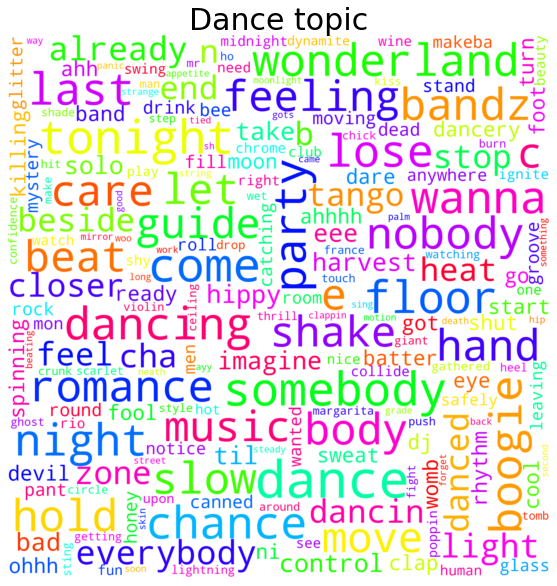

In [70]:
mask = np.full((2000,2000),1)
generate_masked_word_cloud(nmf_topic_weights[dance_topic],
                               mask,
                               song_name='Dance topic',
                               colormap = 'hsv',
                               contour_color='Black',
                               font_path = None)
plt.savefig(f'{url_wordcloud_folder}Dance.svg',format='svg')
plt.show()

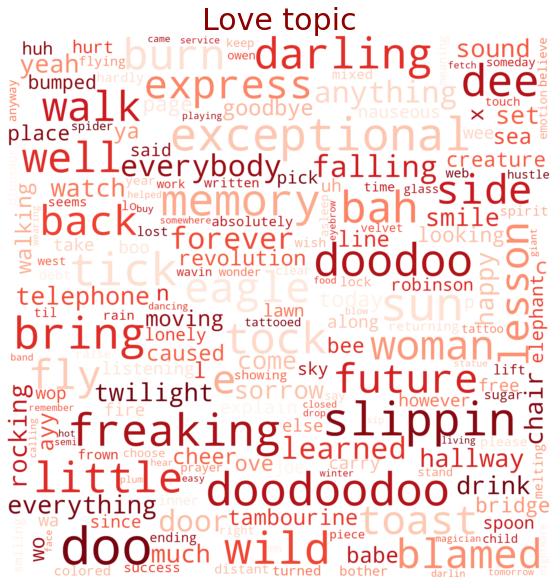

In [71]:
mask = np.full((2000,2000),1)
generate_masked_word_cloud(nmf_topic_weights[love_topic],
                               mask,
                               song_name='Love topic',
                               colormap = 'Reds',
                               contour_color='darkred',
                               font_path = None)

plt.savefig(f'{url_wordcloud_folder}Love.svg',format='svg')
plt.show()

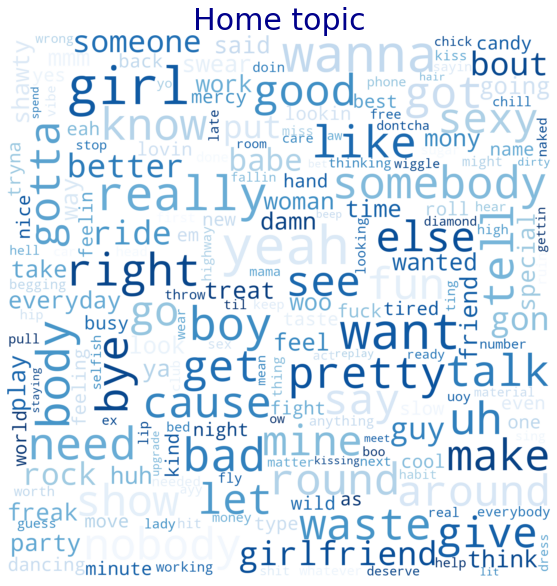

In [72]:
mask = np.full((2000,2000),1)
generate_masked_word_cloud(nmf_topic_weights[home_topic],
                               mask,
                               song_name='Home topic',
                               colormap = 'Blues',
                               contour_color='darkblue',
                               font_path = None)

plt.savefig(f'{url_wordcloud_folder}Home.svg',format='svg')
plt.show()

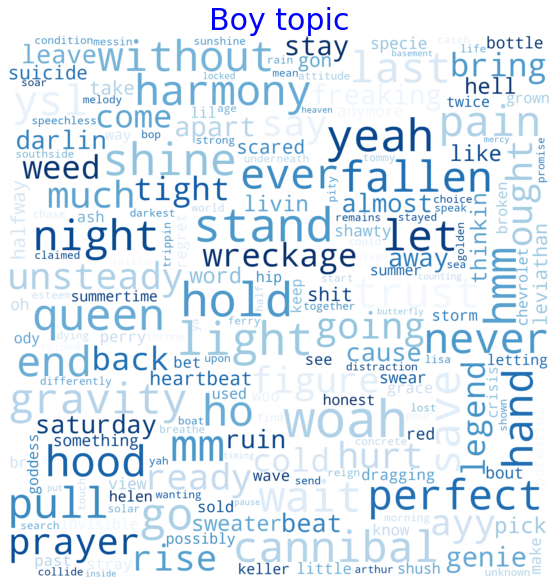

In [73]:
mask = np.full((2000,2000),1)
generate_masked_word_cloud(nmf_topic_weights[21],
                               mask,
                               song_name='Boy topic',
                               colormap = 'Blues',
                               contour_color='blue',
                               font_path = None)
plt.show()

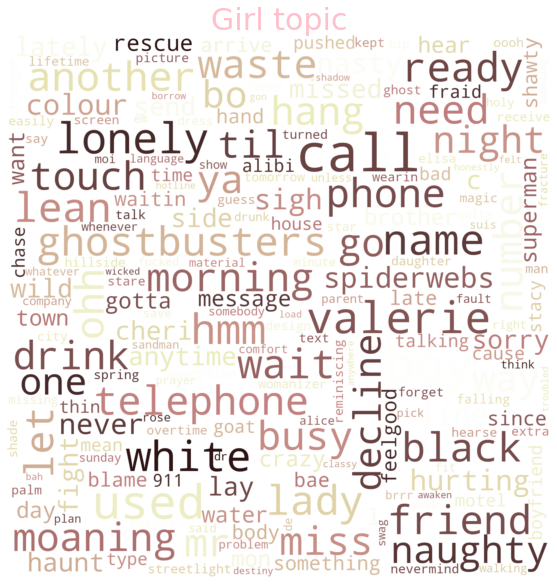

In [74]:
mask = np.full((2000,2000),1)
generate_masked_word_cloud(nmf_topic_weights[25],
                               mask,
                               song_name='Girl topic',
                               colormap = 'pink',
                               contour_color='pink',
                               font_path = None)
plt.show()

### NMF results discussion

We were extremely happy with the results from NMF. We were able to produce just once the results for boy and girl that can be seen on the website, but we hadn't used the 'random_state' parameter to make sure we would get the same results due to the random nature of NMF. However, we found that the Dance, Home, and Love topics were very consistent and appeared almost the same regardless of how many times we tried. This might indicate that these three topics are more 'stable' and that although the boy/girl topics seen on the website were interesting and painted an interesting narrative, they are probably less prevalent than some of these other topics. It's hard to dispute the fact that they are latent in the data regardless since we were able to rediscover a part of the boy genre again in one of the topics, which had the words:

\['away' 'run' 'care' 'far' 'sail' 'walk' 'runaway' 'take']

which might also indicate that the topic we picked for the website as in fact more of an 'adventure' topic and that 'boy' was the least stable word there. 

<a id='3-6'></a>
# 3.6 Interactive KDE plot with plotly

### What we're intersted in
We want to create an interactive plot for our website that can compare the
sentiment distribution for the 10 most common genres.

### Explaining the tool
We will use the an interactive plot in plotly called [Distplot](https://plotly.com/python/distplot/).
We can use the distplot to create a kernel density plot. 
A Density Plot visualises the distribution of data over a continuous interval. 
The resulting figure uses kernel smoothing to plot the values.
This allows for smoother distributions by smoothing out the noise.

In [77]:
hist_data = []
group_labels = []
cmap = sns.color_palette("coolwarm", as_cmap=True)
col = cmap(np.arange(0,cmap.N)) 
colors = []

# retrieve the data for the 10 biggest genres and their colors
i = 250
for genre in biggest_10_sorted:
    x = sentiment_df.loc[sentiment_df.most_freq_genre.isin([genre])].artist_happiness_average.values
    hist_data.append(x)
    group_labels.append(genre)    
    
    colors.append('#%02x%02x%02x' % tuple((col[i][:3]*256).astype(int)))
    
    i-=25

# create the plotly plot
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)

# add labels and style the plot
fig.update_layout(
    title='KDE Plot Showing Top 10 Most Common Genres',
    titlefont=dict(size=16),    
    plot_bgcolor='rgba(65,135,230,0.1)'
)
fig.update_xaxes(
    title='Artist Happiness Average'
)
fig.update_yaxes(
    title='Density'
)

# add traces to color the area under value points
def change_trace(trace):
    if (type(trace.y[0]) != str):
        trace.update(fill='tozeroy')
fig.for_each_trace(change_trace)
[x.title for x in fig.select_yaxes()][1]['text'] = ''

fig.show()

### Discuss the outcome

We are pleased with the outcome of the interactive plot and think it is a 
nice addition to the website.

The person analysing the plot can choose the genres that are of interest and explore their sentiment differences. 


<a id='3-7'></a>
# 3.7 Interactive network visualization with Gephi

### What we're interested in
We want to visualize the network we've created and explore it further. As has been mentioned, the network is quite large (~4.000 nodes and ~30.000 edges) so we need a tool that handles networks of this scale well.

It is necessary that it can be used to examine a network in detail to conduct exploratory analysis. This requires various spatializing functions as well as the possibility to calculate interesting metrics for the network.

Furthermore, we want to be able to upload an interactive version of the network to our website.

### Explaining the tool
The tool we used is called [Gephi](https://gephi.org/). It is an open graph visualizing platform 
that meets all of the requirements we have for visualizing the network.

It can be used both for exploratory analysis as well as social network analysis. 
This means that by using the tool a network can be explored and various properties can be computed.

In addition, the tool can translate a network to website compatible format. 
That is, a network in Gephi can be exported [SigmaJS](http://sigmajs.org/) and uploaded to a website.

### Applying the tool
We used Gephi to import our two networks. Both the full network and the GCC. 
We spatialized the network using the ForceAtlas2 and Circle Pack layouts. 
The layouts do the following:

- ForceAtlas2: This layout is force-directed. Nodes repel from each other, while edges attract their nodes. This forces movement in the network until it reaches a balanced state.
- Circle Pack: This layout allows to group nodes by attribute(s) and plotting them in circles.

Then we colored the nodes using various attributes. We also determined the size of the nodes
using the node attributes, mainly the number of followers. 
When we're satisfied with the layout, colors, and node sizes we export the network as a .svg file 
and upload it to our website.
See an example in the screenshot below.

We repeated this process for all of the network images shown on our website.

![name](https://raw.githubusercontent.com/goh12/socialdataanalysis2020-screenshots/master/sgi/gcc.png)

We downloaded the SigmaExporter plugin in Gephi to export the networks in an interactive, website-compatible format.
The resulting folders were then uploaded to our website. 

We did some fine-tuning of the parameters in the SigmaJs configuration files until we were satisfied.
For example, tweaking the MaxNodeSize and LabelThreshold parameters gave us good results.

#### Betweenness Centrality
Additionally, we computed betweenness centrality in Gephi using the Network Diameter option in the network statistics section.

Then we changed the node size to be determined by the betweenness centrality values instead of the number of followers.

The results of these actions are shown below.

![name](https://raw.githubusercontent.com/goh12/socialdataanalysis2020-screenshots/master/sgi/gcc-centrality.png)

### Discuss the outcome
We were incredibly happy with the results. The tool handled our network well and met all of our requirements.

We were pleased with the layout and style of the networks we created and uploaded to our website. 
We also thought that the interactive functionality came out remarkably well and thought of it as a nice tool 
for discovering new artists that one might be interested in listening to.

Using Gephi, we found that the node with the highest betweenness centrality was the artist Pitbull.
We found this rather amusing if we consider what betweenness centrality means.

Betweenness centrality measures the number of times a node lies on the shortest path between two other nodes.
Therefore, nodes with high betweenness play a vital role when it comes to connecting the whole network. 
Without them, disruption might occur in links between nodes, as they dominate the shortest paths between the nodes.

When the node size is changed according to the betweenness centrality to identify which artists are most 
important when it comes to connecting all the artists in the network. 
The nodes that become the biggest in the network have the highest betweenness centrality, and therefore,
act either as bridges between two parts of the network or shortcuts between distant parts of the network

As previously mentioned, the artist with the highest betweenness centrality in the network is Pitbull. 
This could indicate that Pitbull is related to artists from several other communities (various genres). 
The relation between artists represents what people like. 
Therefore, if people like Pitbull, they might also like the artists he ties together from different clusters.

This shows that Pitbull truly can call himself Mr. Worldwide, which, in fact, he does on every occasion.

<a id='Discussion'></a>

# 4. Discussion

### What went well?,

**Deepnote:** Since the start of the assignment, we have been using Deepnote, which is a website service TA Germans recommended on slack. We were really happy with how easy it made the collaboration and how much it helped to be working and programming in a shared space. Will definitely be using this again for group projects later.   

**Scraping & Pre-processing:** The Spotify API was really nice for scraping and for the most part both datasets were easy to put together and we were able to process them quite reasonably such that we got very nice results from most analysis attempts. 

**Network analysis:** We were almost surprised how logically the network was put together, even after almost arbitrarily picking a subset of artists from the overall network. The communities were very well in line with our intuition of genres and artist relations.

**Sentiment analysis:** The sentiment analysis showed clear patterns within the music industry. We were able to display the sentimental differences between songs, artists, and genres and analyze the changes in sentiment over time.

**TF-IDF & Word clouds**: These came out especially well, thanks to much of the pre-processing which ensured we had much less clutter. 

**Website:** We decided, after the course social data analysis, where we had previously done a website as a final project, to try to do the whole thing without having to run a server to host the website, but instead try to utilize embedded data and packages/services which simplified the development and deployment of the project. This went wonderfully and we were able to include interactive graphs using Gephi while also having super-high-resolution images on the website by using .svg files to generate the graphs at any resolution. We included one interactive plot using Plotly, but that was done with only embedded data as well, so it wasn't an issue.  

**Topic extraction with NMF:** We were pleasantly surprised how well the topic extraction worked and especially how much the boy/girl results shown on the website helped the narrative and also create a nice conclusion to the project. This was fairly easy to implement since one of our members has much experience with this and other such methods. 


### What is still missing? What could be improved?, Why?

**Pre-processing & scraping:** One of the main headaches with pre-processing and cleaning the data was that often results down the line revealed a problem or limitation with the data such as having too much data and it being computationally too heavy for Deepnote. Then we had to go back, change something and run the whole thing over again only to discover again something which had to be fixed and rerun. Because of this, we ended up with a network where only about 2/3 of the nodes had assigned lyrical data since we had filtered out non-English lyrics for simplification. If we could have instead found some way to know in advance more information about the artists, we could have picked a better subset of the network to work with. 

**Sentiment analysis:** Further insights and better results could have been found if the sample we used had included a wider range of songs, both older songs and tokenized lyrics in languages other than English.

**Website:** Finding the right packages was hard and required a lot of trial and error which took much time and work. We would have liked more interactivity but decided against it for sake of keeping the project manageable in size.  

**More things to do with NMF:** Because of how NMF works you can both look at the relative importance of each word in each topic, but you can also look at the abundance of each topic in each song. So what we would have liked to do was find the most exaggerated songs concerning each topic by looking at the topic abundance for each song. We didn't include this because we thought it didn't add enough to the website but just made it much longer.  

<a id='Contributions'></a>

# 5. Contributions
**Shared responsibilities:** Most of the implementation was done by more than one person, often one would start and the other would finish a solution or one would prepare data and the other would analyze it. Writing and result interpretation responsibility was also shared with most parts.

**Guðmundur**: Responsible for creating the website, which includes converting notebook results to website form. Also responsible for network visualization and analysis. Shared responsibility for Genius scraping.

**Rakel**: Responsible for community detection and sentiment analysis, including song, artist, genre, and time analysis wrt. sentiment. Wrote most of the narrative for the website. 

**Sverrir**: Responsible for scraping from Spotify and shared responsibility for Genius scraping, cleaning, and pre-processing artist & lyrics data, TF-IDF, word clouds, and NMF.
